# Su-Schrieffer-Heeger (SSH) Model
## *High Harmonic Generation from a 1D Topological Insulator*

With equal bond lengths the two-site unit cell is inversion-symmetric. The Peierls substitution is the standard **k → k + A** shift:

$$h(k, A) = t_1 + t_2\,e^{-i(k+A)}$$

$$E_\pm(k, A) = \pm\sqrt{t_1^2 + t_2^2 + 2t_1 t_2 \cos(k + A)}$$

The **gap minimum** lives at $k + A = \pi$ and has magnitude $2|t_1 - t_2|$ — independent of $A$.  
The bulk gap never closes under the laser unless $t_1 = t_2$; topological transitions are driven by the **Floquet quasi-energy** spectrum.

**Workflow:**
1. Symbolic — Hamiltonian, eigenvalues, eigenvectors, current operator  
2. Numerics — helpers, $\vec{d}$-vector, dispersion  
3. Floquet — quasi-energy spectrum, gap, winding number, phase diagram, GIF  
4. HHG — power spectrum with phase-transition markers, odd/even decomposition

In [1]:
!pip install -q sympy numpy matplotlib scipy

In [2]:
import sympy as sp
from IPython.display import display, Math, Image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as mgridspec
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.gridspec import GridSpec
from scipy.linalg import expm

## 1. Symbolic Analysis: Peierls Substitution & Bloch Hamiltonian

With equal bond lengths $d_1 = d_2 = \frac{1}{2}$, the Peierls substitution is the simple replacement:

$$k \;\longrightarrow\; k + A(t)$$

The off-diagonal Bloch element is:

$$h(k, A) = t_1 + t_2\,e^{-i(k+A)}$$

so the $\vec{d}$-vector components are:

$$d_x(k, A) = t_1 + t_2\cos(k+A), \qquad d_y(k, A) = -t_2\sin(k+A)$$

The loop $k \in [-\pi, \pi]$ traces an **ellipse** centred at $(t_1,\, 0)$ with radius $t_2$.  
The origin is enclosed iff $t_2 > t_1$ — this is the **topological** phase.

In [3]:
# ── Symbolic variables ─────────────────────────────────────────────────────
k, A = sp.symbols('k A', real=True)
t1s, t2s, E_s = sp.symbols('t_1 t_2 E', positive=True)

# Off-diagonal Bloch element: k→k+A Peierls substitution
h_kA = t1s + t2s * sp.exp(-sp.I * (k + A))

# Bloch Hamiltonian  H = [[0, h], [h*, 0]]
H_sym = sp.Matrix([
    [0,               h_kA             ],
    [sp.conjugate(h_kA),    0          ],
])

display(Math(r"h(k,A) = t_1 + t_2\,e^{-i(k+A)}"))
display(Math(r"H(k,A) = \begin{pmatrix}0 & h^*(k,A)\\ h(k,A) & 0\end{pmatrix}"))

# d-vector components
dx = sp.re(sp.expand(h_kA.rewrite(sp.cos)))
dy = sp.im(sp.expand(h_kA.rewrite(sp.sin)))

display(Math(f"d_x(k,A) = {sp.latex(t1s + t2s*sp.cos(k+A))}"))
display(Math(f"d_y(k,A) = {sp.latex(-t2s*sp.sin(k+A))}"))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

## 2. Eigenvalues and Eigenvectors

$$E_\pm(k,A) = \pm\sqrt{t_1^2 + t_2^2 + 2t_1 t_2 \cos(k+A)}$$

The eigenstates are:

$$|\psi_\pm\rangle = \frac{1}{\sqrt{2}}
\begin{pmatrix} \pm e^{-i\phi(k,A)} \\ 1 \end{pmatrix},
\qquad \phi(k,A) = \arg[h(k,A)] = \arctan\!\left(\frac{-t_2\sin(k+A)}{t_1+t_2\cos(k+A)}\right)$$

In [4]:
# ── Eigenvalues ────────────────────────────────────────────────────────────
h_mod2   = sp.trigsimp(sp.expand(h_kA * sp.conjugate(h_kA)))
h_mod2_c = t1s**2 + t2s**2 + 2*t1s*t2s*sp.cos(k + A)
E_band   = sp.sqrt(h_mod2_c)

display(Math(r"E_\pm(k,A):"))
display(Math(sp.latex(sp.Eq(E_s, E_band))))

# ── Eigenvectors ───────────────────────────────────────────────────────────
phi_sym  = sp.atan2(-t2s*sp.sin(k + A), t1s + t2s*sp.cos(k + A))
psi_plus  = sp.Matrix([ sp.exp(-sp.I*phi_sym), 1]) / sp.sqrt(2)
psi_minus = sp.Matrix([-sp.exp(-sp.I*phi_sym), 1]) / sp.sqrt(2)

display(Math(r"|\psi_+\rangle = \frac{1}{\sqrt{2}}\begin{pmatrix}e^{-i\phi}\\1\end{pmatrix}, "
             r"\quad |\psi_-\rangle = \frac{1}{\sqrt{2}}\begin{pmatrix}-e^{-i\phi}\\1\end{pmatrix}"))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

## 3. Current Operator

The current operator is $\hat{J}(k,A) = -\partial H / \partial A$.

With equal bond lengths both bonds contribute **equally**:

$$-\frac{\partial h}{\partial A} = i\,t_2\,e^{-i(k+A)}$$

so the current matrix element is purely off-diagonal:

$$\hat{J}(k,A) = \begin{pmatrix} 0 & -it_2\,e^{+i(k+A)} \\ i t_2\,e^{-i(k+A)} & 0 \end{pmatrix}$$

The macroscopic current is $J(t) = \mathrm{Tr}[\hat{J}(t)\,\rho(t)]$.

In [5]:
# ── Symbolic current operator ──────────────────────────────────────────────
J_offdiag = -sp.diff(h_kA, A)
J_offdiag_s = sp.simplify(J_offdiag)

display(Math(r"-\partial h/\partial A ="))
display(Math(sp.latex(J_offdiag_s)))

J_sym = sp.Matrix([
    [0,                           sp.conjugate(J_offdiag_s)],
    [J_offdiag_s,                 0                        ],
])
display(Math(r"\hat{J}(k,A) = -\partial H/\partial A:"))
display(J_sym)

# ── Winding number condition ───────────────────────────────────────────────
display(Math(r"\text{Gap closes at }|h|=0 \Rightarrow "
             r"t_1^2+t_2^2+2t_1t_2\cos(k+A)=0 "
             r"\Rightarrow t_1=t_2\text{ (at }k+A=\pi\text{)}"))
display(Math(r"\nu = \frac{1}{2\pi}\oint_{-\pi}^{\pi}\partial_k\phi(k)\,dk "
             r"= \begin{cases}1 & t_2>t_1\;(\text{topological})\\"
             r"0 & t_1>t_2\;(\text{trivial})\end{cases}"))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Matrix([
[                    0, -I*t_2*exp(I*(A + k))],
[I*t_2*exp(-I*(A + k)),                     0]])

<IPython.core.display.Math object>

<IPython.core.display.Math object>

## 4. Numerical Setup

| Parameter | Symbol | Value |
|---|---|---|
| Unit cells | $N$ | 50 |
| Topological hopping | $(t_1, t_2)$ | $(0.6,\ 1.0)$ |
| Trivial hopping | $(t_1, t_2)$ | $(1.0,\ 0.7)$ |
| Drive frequency | $\omega$ | $1.5$ |
| Drive amplitude | $F_0$ | $5.5$ |
| Cycles | $n_\mathrm{cyc}$ | $8$ |

In [6]:
# ── Lattice ────────────────────────────────────────────────────────────────
N_cells = 50
M       = 2 * N_cells

# ── Hopping parameters ────────────────────────────────────────────────────
t1_topo, t2_topo = 0.6, 1.0    # topological:  t2 > t1  → ν = 1
t1_triv, t2_triv = 1.0, 0.8    # trivial:      t1 > t2  → ν = 0

# ── Laser field ────────────────────────────────────────────────────────────
omega  = 1.5
F0     = 2.5
T_per  = 2 * np.pi / omega
n_cyc  = 8
t_max  = n_cyc * T_per
dt     = T_per / 400
t_arr  = np.arange(0, t_max, dt)
Nt     = len(t_arr)

A_arr  = -(F0 / omega) * np.cos(omega * t_arr)   # vector potential
F_arr  =   F0          * np.sin(omega * t_arr)   # electric field

print(f"Lattice sites      M   = {M}")
print(f"Drive period       T   = {T_per:.4f}")
print(f"Time steps         Nt  = {Nt},  dt = {dt:.5f}")
print(f"Max vector pot.    A_max = {F0/omega:.3f}")
print(f"Topo gap (A=0)     Δ   = {2*abs(t1_topo-t2_topo):.2f}")
print(f"Trivial gap (A=0)  Δ   = {2*abs(t1_triv-t2_triv):.2f}")

Lattice sites      M   = 100
Drive period       T   = 4.1888
Time steps         Nt  = 3200,  dt = 0.01047
Max vector pot.    A_max = 1.667
Topo gap (A=0)     Δ   = 0.80
Trivial gap (A=0)  Δ   = 0.40


## 5. Helper Functions: Hamiltonian, Current Operator, Dispersion

**Real-space Hamiltonian** (equal Peierls phases):

$$H(t) = \sum_n t_1\,e^{+iA(t)}|n_B\rangle\langle n_A|
        + \sum_n t_2\,e^{-iA(t)}|(n{+}1)_A\rangle\langle n_B|
        + \mathrm{h.c.}$$

**Current operator** ($J = -\partial H / \partial A$):

$$\hat{J}(t) = \sum_n -it_1 e^{+iA}|n_B\rangle\langle n_A|
             + \sum_n it_2 e^{-iA}|(n{+}1)_A\rangle\langle n_B|
             + \mathrm{h.c.}$$

In [7]:
def build_H(t1, t2, A_val):
    """Real-space SSH Hamiltonian."""
    H   = np.zeros((M, M), dtype=complex)
    ph1 = np.exp(+1j * A_val)   # intracell  A→B
    ph2 = np.exp(-1j * A_val)   # intercell  B→A(n+1)
    for n in range(N_cells):          # intracell
        i, j = 2*n, 2*n+1
        H[j, i] = t1 * ph1
        H[i, j] = np.conj(H[j, i])
    for n in range(N_cells - 1):      # intercell
        i, j = 2*n+1, 2*n+2
        H[j, i] = t2 * ph2
        H[i, j] = np.conj(H[j, i])
    return H


def build_J(t1, t2, A_val):
    """Current operator J = -dH/dA."""
    J   = np.zeros((M, M), dtype=complex)
    ph1 = np.exp(+1j * A_val)
    ph2 = np.exp(-1j * A_val)
    for n in range(N_cells):
        i, j = 2*n, 2*n+1
        J[j, i] = (-1j) * t1 * ph1
        J[i, j] = np.conj(J[j, i])
    for n in range(N_cells - 1):
        i, j = 2*n+1, 2*n+2
        J[j, i] = (+1j) * t2 * ph2
        J[i, j] = np.conj(J[j, i])
    return J


def dispersion(t1, t2, A_val, k_arr):
    """Analytic conduction band E_+(k,A) = sqrt(t1^2+t2^2+2t1t2*cos(k+A))."""
    return np.sqrt(t1**2 + t2**2 + 2*t1*t2*np.cos(k_arr + A_val))


# ── Sanity checks ──────────────────────────────────────────────────────────
print("Static spectrum (A=0):")
for lbl, t1, t2 in [('Topological', t1_topo, t2_topo),
                     ('Trivial',     t1_triv, t2_triv)]:
    ev  = np.linalg.eigvalsh(build_H(t1, t2, 0.0))
    gap = ev[M//2] - ev[M//2 - 1]
    print(f"  {lbl:12s}  gap = {gap:.4f}  "
          f"mid-states = {np.round(ev[M//2-2:M//2+2], 5)}")

print(f"\nJ Hermitian: {np.allclose(build_J(t1_topo,t2_topo,0.3), build_J(t1_topo,t2_topo,0.3).conj().T)}")

Static spectrum (A=0):
  Topological   gap = 0.0000  mid-states = [-0.40313 -0.       0.       0.40313]
  Trivial       gap = 0.4129  mid-states = [-0.22486 -0.20644  0.20644  0.22486]

J Hermitian: True


## 6. $\vec{d}$-Vector Ellipse

The $\vec{d}$-vector traces a closed loop in $(d_x, d_y)$ space as $k$ sweeps the BZ:

$$d_x(k,A) = t_1 + t_2\cos(k+A), \qquad d_y(k,A) = -t_2\sin(k+A)$$

- **Topological** ($t_2 > t_1$): loop **encloses** the origin → winding number $\nu = 1$  
- **Trivial** ($t_1 > t_2$): loop **misses** the origin → $\nu = 0$  

The laser shifts the loop horizontally but does not change which phase the system is in (in the instantaneous sense). Only the Floquet propagator can change $\nu$.

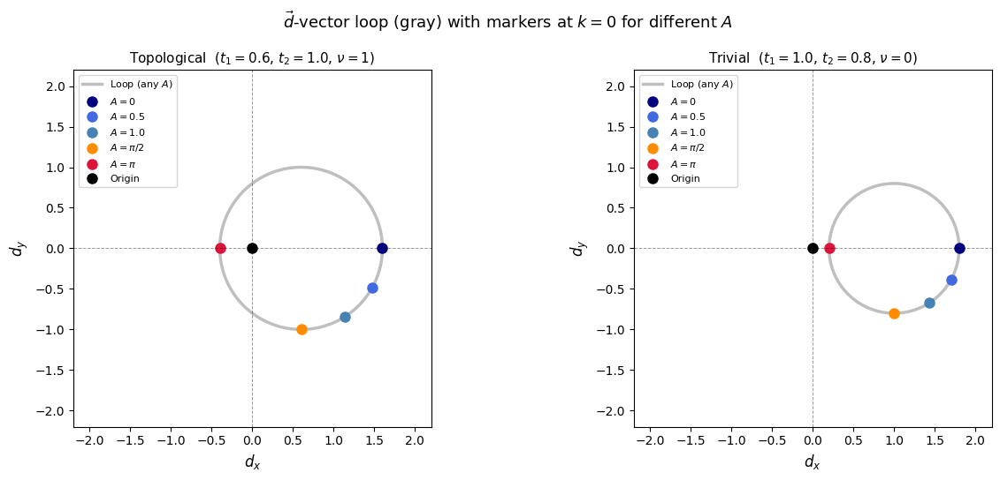

In [8]:
# ── Static d-vector plot: one loop + markers for different A ──────────────
k_num  = np.linspace(-np.pi, np.pi, 1000)
A_vals = [0.0, 0.5, 1.0, np.pi/2, np.pi]
colors = ['navy', 'royalblue', 'steelblue', 'darkorange', 'crimson']
labels = ['$A=0$', '$A=0.5$', '$A=1.0$', r'$A=\pi/2$', r'$A=\pi$']

fig, axes = plt.subplots(1, 2, figsize=(13, 5.5))

for ax, (t1_p, t2_p, phase_lbl) in zip(axes, [
        (t1_topo, t2_topo, fr'Topological  ($t_1={t1_topo}$, $t_2={t2_topo}$, $\nu=1$)'),
        (t1_triv, t2_triv, fr'Trivial  ($t_1={t1_triv}$, $t_2={t2_triv}$, $\nu=0$)')]):

    # Plot the loop for A=0 (one representative)
    dx0 =  t1_p + t2_p * np.cos(k_num)
    dy0 = -t2_p * np.sin(k_num)
    ax.plot(dx0, dy0, 'gray', lw=2.5, alpha=0.5, label='Loop (any $A$)')

    # Mark the point at k=0 for each A value
    for A_v, col, lbl in zip(A_vals, colors, labels):
        dx_m =  t1_p + t2_p * np.cos(0 + A_v)   # k=0
        dy_m = -t2_p * np.sin(0 + A_v)
        ax.plot(dx_m, dy_m, 'o', color=col, ms=8, label=lbl)

    ax.axhline(0, color='black', lw=0.7, ls='--', alpha=0.4)
    ax.axvline(0, color='black', lw=0.7, ls='--', alpha=0.4)
    ax.plot(0, 0, 'ko', ms=8, zorder=6, label='Origin')
    ax.set_xlabel(r'$d_x$', fontsize=12)
    ax.set_ylabel(r'$d_y$', fontsize=12)
    ax.set_title(phase_lbl, fontsize=11)
    ax.set_aspect('equal')
    lim = max(t1_p, t2_p) * 2.2
    ax.set_xlim(-lim, lim); ax.set_ylim(-lim, lim)
    ax.legend(fontsize=8, loc='best')

plt.suptitle(r'$\vec{d}$-vector loop (gray) with markers at $k=0$ for different $A$',
             fontsize=13)
plt.tight_layout()
plt.savefig('dvector_ellipse.png', dpi=150, bbox_inches='tight')
plt.show()

Saved → dvector_cycle.gif


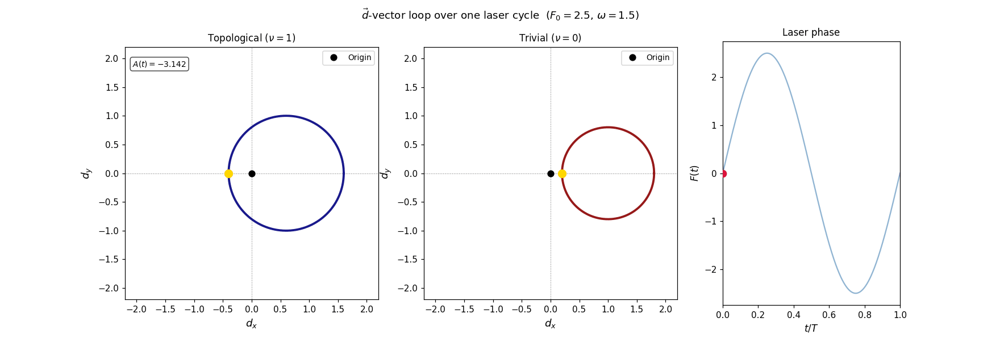

In [9]:
# ── d-vector animation over one laser cycle ────────────────────────────────
n_frames_d = 100
t_cyc_d    = np.linspace(0, T_per, n_frames_d, endpoint=False)
A_cyc_d = np.linspace(-np.pi, np.pi, n_frames_d, endpoint=False)
t_prog_d   = np.linspace(0, T_per, 400)
F_prog_d   = F0 * np.sin(omega * t_prog_d)

fig_d, axes_d = plt.subplots(1, 3, figsize=(16, 5.5),
                               gridspec_kw=dict(width_ratios=[1, 1, 0.7]))
ax_t, ax_v, ax_pr = axes_d

for ax, (t1_p, t2_p, phase_lbl, col) in zip([ax_t, ax_v], [
        (t1_topo, t2_topo, fr'Topological ($\nu=1$)', 'navy'),
        (t1_triv, t2_triv, fr'Trivial ($\nu=0$)', 'darkred')]):
    ax.axhline(0, color='black', lw=0.5, ls='--', alpha=0.4)
    ax.axvline(0, color='black', lw=0.5, ls='--', alpha=0.4)
    ax.plot(0, 0, 'ko', ms=7, zorder=6, label='Origin')
    ax.set_xlabel(r'$d_x$', fontsize=12)
    ax.set_ylabel(r'$d_y$', fontsize=12)
    ax.set_title(phase_lbl, fontsize=11)
    ax.set_aspect('equal')
    lim = max(t1_p, t2_p) * 2.2
    ax.set_xlim(-lim, lim); ax.set_ylim(-lim, lim)
    ax.legend(fontsize=9)

# progress bar
ax_pr.plot(t_prog_d / T_per, F_prog_d, color='steelblue', lw=1.5, alpha=0.6)
ax_pr.set_xlim(0, 1)
ax_pr.set_xlabel(r'$t/T$', fontsize=11)
ax_pr.set_ylabel(r'$F(t)$', fontsize=11)
ax_pr.set_title('Laser phase', fontsize=11)

loop_t, = ax_t.plot([], [], color='navy',    lw=2.5, alpha=0.9)
loop_v, = ax_v.plot([], [], color='darkred', lw=2.5, alpha=0.9)
dot_t,  = ax_t.plot([], [], 'o', color='gold', ms=9, zorder=7)
dot_v,  = ax_v.plot([], [], 'o', color='gold', ms=9, zorder=7)
prog_d, = ax_pr.plot([], [], 'o', color='crimson', ms=8, zorder=5)
vl_d    = ax_pr.axvline(0, color='crimson', lw=1.2, ls='--', alpha=0.7)
txt_d   = ax_t.text(0.03, 0.95, '', transform=ax_t.transAxes, fontsize=9,
                     va='top', bbox=dict(boxstyle='round', fc='white', alpha=0.7))

fig_d.suptitle(fr'$\vec{{d}}$-vector loop over one laser cycle  ($F_0={F0}$, $\omega={omega}$)',
               fontsize=12)

def update_d(frame):
    A_v = A_cyc_d[frame]
    ph  = frame / n_frames_d
    for ax, t1_p, t2_p, loop_h, dot_h in [
            (ax_t, t1_topo, t2_topo, loop_t, dot_t),
            (ax_v, t1_triv, t2_triv, loop_v, dot_v)]:
        dx_n =  t1_p + t2_p * np.cos(k_num + A_v)
        dy_n = -t2_p * np.sin(k_num + A_v)
        loop_h.set_data(dx_n, dy_n)
        dot_h.set_data([t1_p + t2_p * np.cos(0 + A_v)],
                       [-t2_p * np.sin(0 + A_v)])   # k=0 marker
    prog_d.set_data([ph], [F0 * np.sin(omega * t_cyc_d[frame])])
    vl_d.set_xdata([ph, ph])
    txt_d.set_text(fr'$A(t) = {A_v:+.3f}$')
    return loop_t, loop_v, dot_t, dot_v, prog_d, vl_d, txt_d

anim_d = animation.FuncAnimation(fig_d, update_d, frames=n_frames_d,
                                   interval=60, blit=True)
anim_d.save('dvector_cycle.gif', writer=PillowWriter(fps=18), dpi=110)
plt.close(fig_d)
print("Saved → dvector_cycle.gif")
Image('dvector_cycle.gif')

## 7. Eigenenergy Dispersion vs Vector Potential

$$E_\pm(k,A) = \pm\sqrt{t_1^2 + t_2^2 + 2t_1t_2\cos(k+A)}$$

The laser **shifts the gap minimum** from $k=\pi$ to $k = \pi - A$, but the **gap magnitude** $2|t_1 - t_2|$ is unchanged.

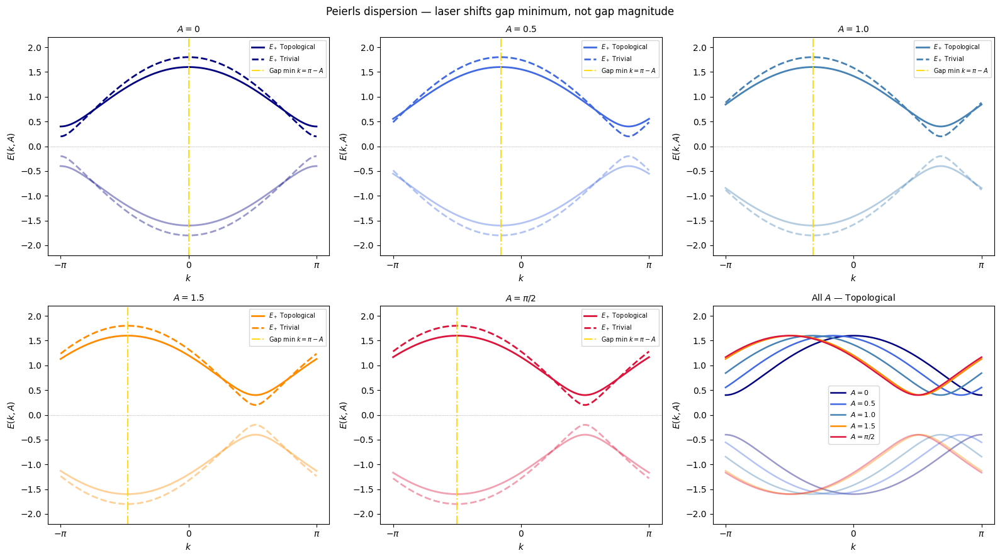

In [10]:
A_plot   = [0.0, 0.5, 1.0, 1.5, np.pi/2]
A_labels = ['$A=0$','$A=0.5$','$A=1.0$','$A=1.5$',r'$A=\pi/2$']
cols_A   = ['navy','royalblue','steelblue','darkorange','crimson']

fig, axes = plt.subplots(2, 3, figsize=(16, 9))
axes_f = axes.flatten()

for idx, (A_v, lbl, col) in enumerate(zip(A_plot, A_labels, cols_A)):
    ax = axes_f[idx]
    for t1_p, t2_p, ls, plbl in [
            (t1_topo, t2_topo, '-',  'Topological'),
            (t1_triv, t2_triv, '--', 'Trivial')]:
        Ep = dispersion(t1_p, t2_p, A_v, k_num)
        ax.plot(k_num,  Ep, color=col, ls=ls, lw=2.0, label=f'$E_+$ {plbl}')
        ax.plot(k_num, -Ep, color=col, ls=ls, lw=2.0, alpha=0.4)
    gap_pos = np.pi - A_v              # k-position of gap minimum
    ax.axvline(gap_pos % (2*np.pi) - np.pi, color='gold', lw=1.5,
               ls='-.', alpha=0.9, label=r'Gap min $k=\pi-A$')
    ax.axhline(0, color='gray', lw=0.5, ls=':')
    ax.set_title(f'{lbl}', fontsize=10)
    ax.set_xlabel(r'$k$')
    ax.set_ylabel(r'$E(k,A)$')
    ax.set_xticks([-np.pi, 0, np.pi])
    ax.set_xticklabels([r'$-\pi$','$0$',r'$\pi$'])
    ax.set_ylim(-2.2, 2.2)
    ax.legend(fontsize=7, loc='upper right')

# All A overlaid
ax = axes_f[-1]
for A_v, lbl, col in zip(A_plot, A_labels, cols_A):
    Ep = dispersion(t1_topo, t2_topo, A_v, k_num)
    ax.plot(k_num,  Ep, color=col, lw=1.8, label=lbl)
    ax.plot(k_num, -Ep, color=col, lw=1.8, alpha=0.4)
ax.set_title('All $A$ — Topological', fontsize=10)
ax.set_xlabel(r'$k$'); ax.set_ylabel(r'$E(k,A)$')
ax.set_xticks([-np.pi, 0, np.pi])
ax.set_xticklabels([r'$-\pi$','$0$',r'$\pi$'])
ax.set_ylim(-2.2, 2.2)
ax.legend(fontsize=8)

plt.suptitle('Peierls dispersion — laser shifts gap minimum, not gap magnitude',
             fontsize=12)
plt.tight_layout()
plt.savefig('dispersion_vs_A.png', dpi=150, bbox_inches='tight')
plt.show()

## 8. Floquet Analysis

Under a periodic laser $A(t) = -\frac{F_0}{\omega}\cos(\omega t)$, we compute the **one-cycle Floquet propagator**:

$$U_F(k) = \mathcal{T}\exp\!\left(-i\int_0^T H(k,A(t))\,dt\right)$$

The **quasi-energies** $\varepsilon$ are defined by $U_F|u\rangle = e^{-i\varepsilon T}|u\rangle$.

Unlike instantaneous bands, quasi-energies can **cross** at $\varepsilon = 0$ or $\varepsilon = \pm\pi/T$, driving laser-induced topological phase transitions.

In [11]:
# ── 2×2 Bloch Hamiltonian (k→k+A gauge) ───────────────────────────────────
def bloch_H_2x2(t1, t2, A_val, k_arr):
    """2×2 Bloch H(k,A) for all k; shape (Nk,2,2)."""
    h = t1 + t2 * np.exp(-1j * (k_arr + A_val))
    H = np.zeros((len(k_arr), 2, 2), dtype=complex)
    H[:, 0, 1] = h
    H[:, 1, 0] = np.conj(h)
    return H


def floquet_propagator_batch(t1, t2, F0_val, k_arr, n_steps=200):
    """One-cycle Floquet U_F(k) via RK4 for all k. Returns (Nk,2,2)."""
    T_laser = 2*np.pi / omega
    dt_f    = T_laser / n_steps
    t_f     = np.linspace(0, T_laser, n_steps, endpoint=False)
    A_f     = -(F0_val / omega) * np.cos(omega * t_f)

    Nk = len(k_arr)
    U  = np.zeros((Nk, 2, 2), dtype=complex)
    U[:, 0, 0] = 1.0
    U[:, 1, 1] = 1.0

    def f(u, H):
        return -1j * np.einsum('kij,kjl->kil', H, u)

    for step in range(n_steps):
        H_now  = bloch_H_2x2(t1, t2, A_f[step], k_arr)
        H_next = bloch_H_2x2(t1, t2, A_f[(step+1) % n_steps], k_arr)
        H_mid  = 0.5*(H_now + H_next)
        k1 = f(U, H_now)
        k2 = f(U + 0.5*dt_f*k1, H_mid)
        k3 = f(U + 0.5*dt_f*k2, H_mid)
        k4 = f(U +     dt_f*k3, H_next)
        U  = U + (dt_f/6.0)*(k1 + 2*k2 + 2*k3 + k4)
    return U


def floquet_spectrum_realspace(t1, t2, F0_val, n_steps=200):
    """Full real-space quasi-energy spectrum from M×M propagator."""
    T_laser = 2*np.pi / omega
    dt_f    = T_laser / n_steps
    t_f     = np.linspace(0, T_laser, n_steps, endpoint=False)
    A_f     = -(F0_val / omega) * np.cos(omega * t_f)
    U = np.eye(M, dtype=complex)
    for step in range(n_steps):
        U = expm(-1j * build_H(t1, t2, A_f[step]) * dt_f) @ U
    eig_U = np.linalg.eigvals(U)
    return np.sort((-np.angle(eig_U) / T_laser).real)


# ── Scan F0 ────────────────────────────────────────────────────────────────
F0_scan    = np.linspace(0.0, 2.5, 50)
QE_topo    = []
QE_triv    = []

print("Computing Floquet quasi-energy spectra (real-space) ...")
for idx, F0_val in enumerate(F0_scan):
    QE_topo.append(floquet_spectrum_realspace(t1_topo, t2_topo, F0_val))
    QE_triv.append(floquet_spectrum_realspace(t1_triv, t2_triv, F0_val))
    if idx % 7 == 0:
        print(f"  F0 = {F0_val:.3f}")

QE_topo = np.array(QE_topo)
QE_triv = np.array(QE_triv)
print("Done.")

Computing Floquet quasi-energy spectra (real-space) ...
  F0 = 0.000
  F0 = 0.357
  F0 = 0.714
  F0 = 1.071
  F0 = 1.429
  F0 = 1.786
  F0 = 2.143
  F0 = 2.500
Done.


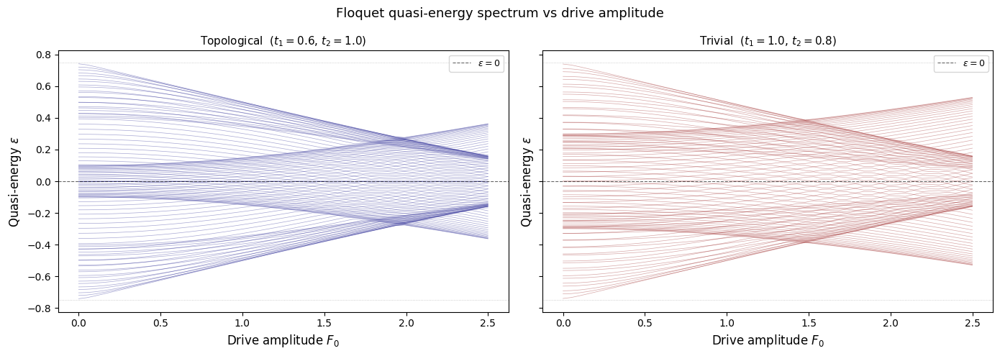

In [12]:
# ── Plot Floquet spectrum vs F0 ────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

T_laser = 2*np.pi / omega
qe_lim  = np.pi / T_laser

for ax, QE, col, lbl in zip(
        axes,
        [QE_topo, QE_triv],
        ['navy', 'darkred'],
        [fr'Topological  ($t_1={t1_topo}$, $t_2={t2_topo}$)',
         fr'Trivial  ($t_1={t1_triv}$, $t_2={t2_triv}$)']):
    for m in range(M):
        ax.plot(F0_scan, QE[:, m], color=col, lw=0.5, alpha=0.35)
    ax.axhline( 0,      color='black', lw=0.8, ls='--', alpha=0.6, label='$\\varepsilon=0$')
    ax.axhline( qe_lim, color='gray',  lw=0.6, ls=':',  alpha=0.5)
    ax.axhline(-qe_lim, color='gray',  lw=0.6, ls=':',  alpha=0.5)
    ax.set_xlabel(r'Drive amplitude $F_0$', fontsize=12)
    ax.set_ylabel(r'Quasi-energy $\varepsilon$', fontsize=12)
    ax.set_title(lbl, fontsize=11)
    ax.legend(fontsize=9)

plt.suptitle('Floquet quasi-energy spectrum vs drive amplitude', fontsize=13)
plt.tight_layout()
plt.savefig('floquet_spectrum.png', dpi=150, bbox_inches='tight')
plt.show()

Pre-computing instantaneous spectra ...
Done.
Saved → floquet_eigenenergy_cycle.gif


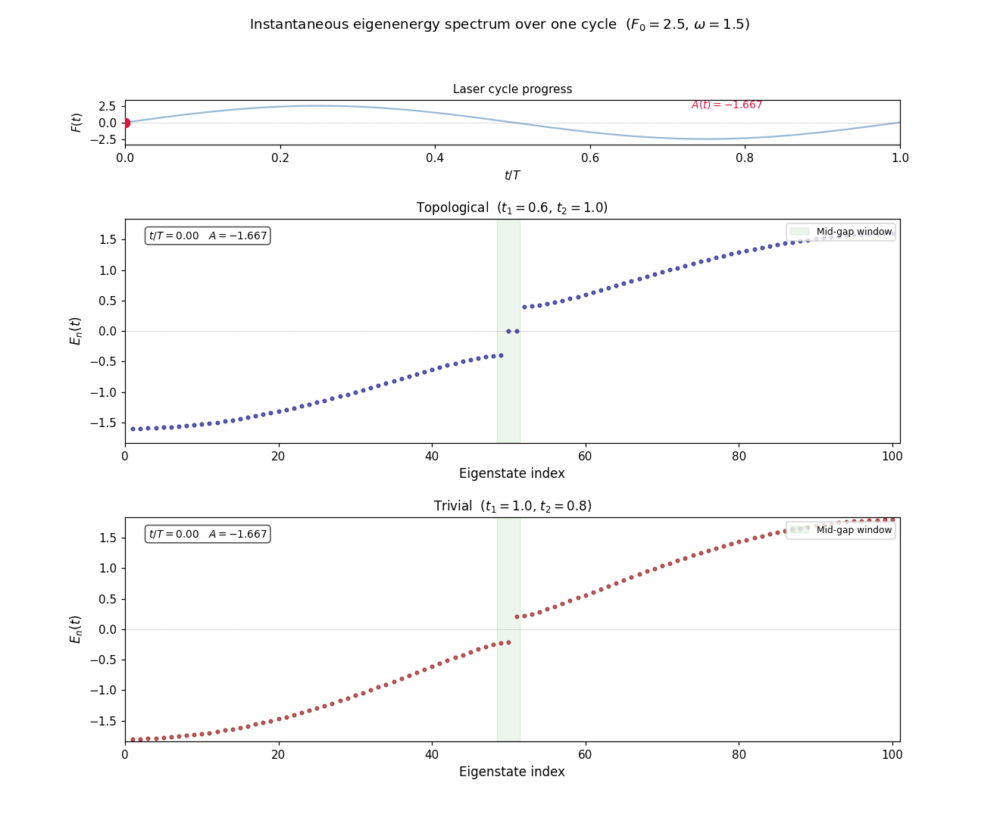

In [13]:
# ── Floquet instantaneous eigenenergy animation (over one cycle) ───────────
n_frames_fl = 120
t_cyc_fl    = np.linspace(0, T_per, n_frames_fl, endpoint=False)
A_cyc_fl    = -(F0 / omega) * np.cos(omega * t_cyc_fl)
t_prog_fl   = np.linspace(0, T_per, 400)
F_prog_fl   = F0 * np.sin(omega * t_prog_fl)

# Pre-compute instantaneous spectra
print("Pre-computing instantaneous spectra ...")
spec_fl_topo = np.zeros((n_frames_fl, M))
spec_fl_triv = np.zeros((n_frames_fl, M))
for f, A_v in enumerate(A_cyc_fl):
    spec_fl_topo[f] = np.linalg.eigvalsh(build_H(t1_topo, t2_topo, A_v))
    spec_fl_triv[f] = np.linalg.eigvalsh(build_H(t1_triv, t2_triv, A_v))
idx_axis = np.arange(1, M + 1)
E_max_fl = np.max(np.abs(spec_fl_topo)) * 1.15
print("Done.")

fig_fl, axes_fl = plt.subplots(3, 1, figsize=(12, 10),
                                 gridspec_kw=dict(height_ratios=[0.2,1,1], hspace=0.45))
ax_pr_fl, ax_t_fl, ax_v_fl = axes_fl

# progress bar
ax_pr_fl.plot(t_prog_fl/T_per, F_prog_fl, color='steelblue', lw=1.5, alpha=0.55)
ax_pr_fl.axhline(0, color='gray', lw=0.5, ls=':')
ax_pr_fl.set_xlim(0,1); ax_pr_fl.set_ylim(-F0*1.35, F0*1.35)
ax_pr_fl.set_xlabel(r'$t/T$', fontsize=10); ax_pr_fl.set_ylabel(r'$F(t)$', fontsize=10)
ax_pr_fl.set_title('Laser cycle progress', fontsize=10)
prog_dot_fl, = ax_pr_fl.plot([], [], 'o', color='crimson', ms=8, zorder=5)
vl_fl        = ax_pr_fl.axvline(0, color='crimson', lw=1.2, ls='--', alpha=0.7)
A_txt_fl     = ax_pr_fl.text(0.73, 0.82, '', transform=ax_pr_fl.transAxes,
                               fontsize=9, color='crimson')

mid_lo = M//2 - 1; mid_hi = M//2
for ax, col, title in [
        (ax_t_fl, 'navy',    fr'Topological  ($t_1={t1_topo}$, $t_2={t2_topo}$)'),
        (ax_v_fl, 'darkred', fr'Trivial  ($t_1={t1_triv}$, $t_2={t2_triv}$)')]:
    ax.set_xlim(0, M+1); ax.set_ylim(-E_max_fl, E_max_fl)
    ax.axhline(0, color='gray', lw=0.5, ls=':')
    ax.axvspan(mid_lo - 0.5, mid_hi + 1.5, alpha=0.07, color='green', label='Mid-gap window')
    ax.set_xlabel('Eigenstate index', fontsize=11)
    ax.set_ylabel(r'$E_n(t)$', fontsize=11)
    ax.set_title(title, fontsize=11)
    ax.legend(fontsize=8, loc='upper right')

scat_t, = ax_t_fl.plot([], [], 'o', color='navy',    ms=3, alpha=0.6)
scat_v, = ax_v_fl.plot([], [], 'o', color='darkred', ms=3, alpha=0.6)
txt_t   = ax_t_fl.text(0.03, 0.95, '', transform=ax_t_fl.transAxes, fontsize=9,
                         va='top', bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.7))
txt_v   = ax_v_fl.text(0.03, 0.95, '', transform=ax_v_fl.transAxes, fontsize=9,
                         va='top', bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.7))
fig_fl.suptitle(fr'Instantaneous eigenenergy spectrum over one cycle  ($F_0={F0}$, $\omega={omega}$)',
                fontsize=12)

def update_fl(frame):
    ph  = frame / n_frames_fl
    A_v = A_cyc_fl[frame]
    scat_t.set_data(idx_axis, spec_fl_topo[frame])
    scat_v.set_data(idx_axis, spec_fl_triv[frame])
    prog_dot_fl.set_data([ph], [F0*np.sin(omega*t_cyc_fl[frame])])
    vl_fl.set_xdata([ph, ph])
    stamp = fr'$t/T={ph:.2f}$   $A={A_v:+.3f}$'
    txt_t.set_text(stamp); txt_v.set_text(stamp)
    A_txt_fl.set_text(fr'$A(t)={A_v:+.3f}$')
    return scat_t, scat_v, prog_dot_fl, vl_fl, txt_t, txt_v, A_txt_fl

anim_fl = animation.FuncAnimation(fig_fl, update_fl, frames=n_frames_fl,
                                    interval=60, blit=True)
anim_fl.save('floquet_eigenenergy_cycle.gif', writer=PillowWriter(fps=18), dpi=110)
plt.close(fig_fl)
print("Saved → floquet_eigenenergy_cycle.gif")
Image('floquet_eigenenergy_cycle.gif')

Saved → dispersion_cycle.gif


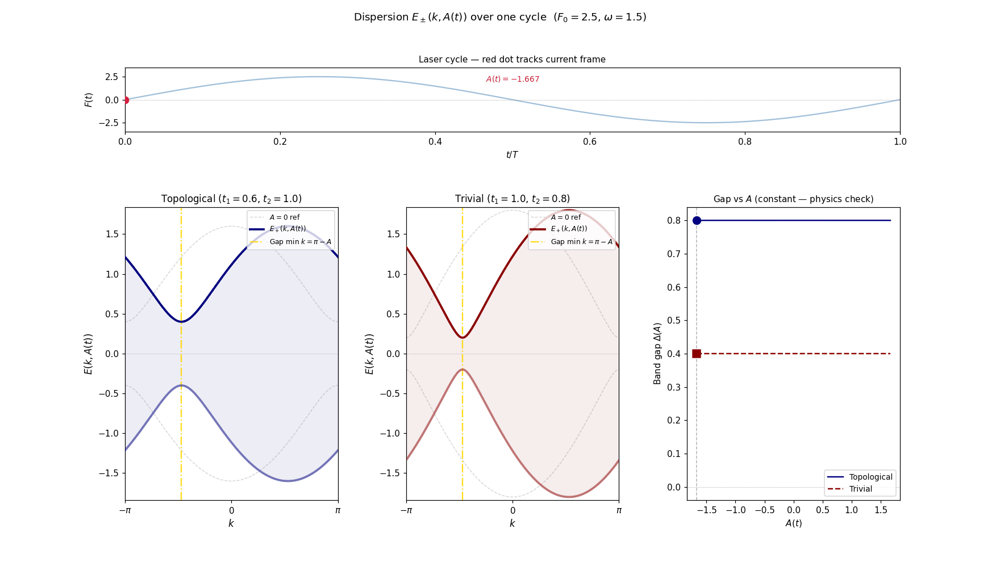

In [14]:
# ── Dispersion relation animation over one laser cycle ─────────────────────
k_fine  = np.linspace(-np.pi, np.pi, 600)
E0_topo = dispersion(t1_topo, t2_topo, 0.0, k_fine)
E0_triv = dispersion(t1_triv, t2_triv, 0.0, k_fine)

A_range    = np.linspace(-F0/omega, F0/omega, 300)
gap_topo_A = np.array([2*dispersion(t1_topo, t2_topo, Av, k_fine).min() for Av in A_range])
gap_triv_A = np.array([2*dispersion(t1_triv, t2_triv, Av, k_fine).min() for Av in A_range])

n_frames_dr = 100
t_cyc_dr    = np.linspace(0, T_per, n_frames_dr, endpoint=False)
A_cyc_dr    = -(F0 / omega) * np.cos(omega * t_cyc_dr)
t_prog_dr   = np.linspace(0, T_per, 400)

fig_dr = plt.figure(figsize=(16, 9))
gs_dr  = GridSpec(2, 3, figure=fig_dr, height_ratios=[0.22,1], hspace=0.42, wspace=0.32)
ax_prog_dr = fig_dr.add_subplot(gs_dr[0, :])
ax_topo_dr = fig_dr.add_subplot(gs_dr[1, 0])
ax_triv_dr = fig_dr.add_subplot(gs_dr[1, 1])
ax_gap_dr  = fig_dr.add_subplot(gs_dr[1, 2])

# Progress bar
ax_prog_dr.plot(t_prog_dr/T_per, F0*np.sin(omega*t_prog_dr), color='steelblue', lw=1.5, alpha=0.5)
ax_prog_dr.axhline(0, color='gray', lw=0.5, ls=':')
ax_prog_dr.set_xlim(0,1); ax_prog_dr.set_ylim(-F0*1.4, F0*1.4)
ax_prog_dr.set_xlabel(r'$t/T$',fontsize=10); ax_prog_dr.set_ylabel(r'$F(t)$',fontsize=10)
ax_prog_dr.set_title('Laser cycle — red dot tracks current frame',fontsize=10)
prog_dot_dr, = ax_prog_dr.plot([],[],  'o', color='crimson', ms=8, zorder=5)
prog_vl_dr   = ax_prog_dr.axvline(0, color='crimson', lw=1.1, ls='--', alpha=0.6)
A_lbl_dr     = ax_prog_dr.text(0.5, 0.78,'',transform=ax_prog_dr.transAxes,
                                 fontsize=9, color='crimson', ha='center')

E_max_dr = (t1_topo+t2_topo)*1.15
for ax, E0, t1_p, t2_p, col, title in [
        (ax_topo_dr, E0_topo, t1_topo, t2_topo, 'navy',
         fr'Topological ($t_1={t1_topo}$, $t_2={t2_topo}$)'),
        (ax_triv_dr, E0_triv, t1_triv, t2_triv, 'darkred',
         fr'Trivial ($t_1={t1_triv}$, $t_2={t2_triv}$)')]:
    ax.plot(k_fine,  E0, 'gray', lw=0.9, ls='--', alpha=0.35, label='$A=0$ ref', zorder=1)
    ax.plot(k_fine, -E0, 'gray', lw=0.9, ls='--', alpha=0.35, zorder=1)
    ax.axhline(0, color='gray', lw=0.4, ls=':')  # ← Fixed this line
    ax.set_xlim(-np.pi,np.pi); ax.set_ylim(-E_max_dr,E_max_dr)
    ax.set_xticks([-np.pi,0,np.pi]); ax.set_xticklabels([r'$-\pi$','$0$',r'$\pi$'])
    ax.set_xlabel(r'$k$',fontsize=11); ax.set_ylabel(r'$E(k,A(t))$',fontsize=11)
    ax.set_title(title,fontsize=11)
    ax.legend(fontsize=8,loc='upper right')

ax_gap_dr.plot(A_range, gap_topo_A, color='navy',    lw=1.6, label='Topological')
ax_gap_dr.plot(A_range, gap_triv_A, color='darkred', lw=1.6, ls='--', label='Trivial')
ax_gap_dr.axhline(0, color='gray', lw=0.5, ls=':')
ax_gap_dr.set_xlabel(r'$A(t)$',fontsize=10)
ax_gap_dr.set_ylabel(r'Band gap $\Delta(A)$',fontsize=10)
ax_gap_dr.set_title('Gap vs $A$ (constant — physics check)',fontsize=10)
ax_gap_dr.legend(fontsize=9)

line_tp, = ax_topo_dr.plot([],[], color='navy',    lw=2.5, zorder=3, label='$E_+(k,A(t))$')
line_tm, = ax_topo_dr.plot([],[], color='navy',    lw=2.5, zorder=3, alpha=0.5)
line_vp, = ax_triv_dr.plot([],[], color='darkred', lw=2.5, zorder=3, label='$E_+(k,A(t))$')
line_vm, = ax_triv_dr.plot([],[], color='darkred', lw=2.5, zorder=3, alpha=0.5)
gmin_t   = ax_topo_dr.axvline(0, color='gold', lw=1.5, ls='-.', alpha=0.9, label=r'Gap min $k=\pi-A$')
gmin_v   = ax_triv_dr.axvline(0, color='gold', lw=1.5, ls='-.', alpha=0.9, label=r'Gap min $k=\pi-A$')
gap_dot_t,= ax_gap_dr.plot([],[], 'o', color='navy',    ms=9, zorder=5)
gap_dot_v,= ax_gap_dr.plot([],[], 's', color='darkred', ms=9, zorder=5)
gap_vl_dr = ax_gap_dr.axvline(0, color='dimgray', lw=1, ls='--', alpha=0.5)
for ax in (ax_topo_dr, ax_triv_dr): ax.legend(fontsize=8, loc='upper right')
fig_dr.suptitle(fr'Dispersion $E_\pm(k,A(t))$ over one cycle  ($F_0={F0}$, $\omega={omega}$)',fontsize=12)

fill_t = ax_topo_dr.fill_between(k_fine, np.zeros_like(k_fine), np.zeros_like(k_fine), alpha=0.08, color='navy')
fill_v = ax_triv_dr.fill_between(k_fine, np.zeros_like(k_fine), np.zeros_like(k_fine), alpha=0.08, color='darkred')

def update_dr(frame):
    global fill_t, fill_v
    A_v = A_cyc_dr[frame]; ph = frame/n_frames_dr
    Ep_t = dispersion(t1_topo, t2_topo, A_v, k_fine)
    Ep_v = dispersion(t1_triv, t2_triv, A_v, k_fine)
    line_tp.set_data(k_fine,  Ep_t); line_tm.set_data(k_fine, -Ep_t)
    line_vp.set_data(k_fine,  Ep_v); line_vm.set_data(k_fine, -Ep_v)
    fill_t.remove(); fill_v.remove()
    fill_t = ax_topo_dr.fill_between(k_fine, -Ep_t, Ep_t, alpha=0.07, color='navy',    zorder=0)
    fill_v = ax_triv_dr.fill_between(k_fine, -Ep_v, Ep_v, alpha=0.07, color='darkred', zorder=0)
    km = (np.pi - A_v)                                     # gap minimum k
    km = (km + np.pi) % (2*np.pi) - np.pi                 # fold to [-π,π]
    gmin_t.set_xdata([km, km]); gmin_v.set_xdata([km, km])
    gap_dot_t.set_data([A_v],[2*Ep_t.min()])
    gap_dot_v.set_data([A_v],[2*Ep_v.min()])
    gap_vl_dr.set_xdata([A_v, A_v])
    prog_dot_dr.set_data([ph],[F0*np.sin(omega*t_cyc_dr[frame])])
    prog_vl_dr.set_xdata([ph,ph])
    A_lbl_dr.set_text(fr'$A(t)={A_v:+.3f}$')
    return (line_tp,line_tm,line_vp,line_vm,fill_t,fill_v,
            gmin_t,gmin_v,gap_dot_t,gap_dot_v,gap_vl_dr,
            prog_dot_dr,prog_vl_dr,A_lbl_dr)

anim_dr = animation.FuncAnimation(fig_dr, update_dr, frames=n_frames_dr,
                                    interval=60, blit=True)
anim_dr.save('dispersion_cycle.gif', writer=PillowWriter(fps=18), dpi=110)
plt.close(fig_dr)
print("Saved → dispersion_cycle.gif")
Image('dispersion_cycle.gif')

## 9. Floquet Gap vs Drive Amplitude

The **instantaneous** gap $2|t_1-t_2|$ is constant (laser only shifts the gap minimum in $k$).

The **Floquet quasi-energy gap** can close because $U_F(k)$ accumulates phase over the full cycle. Gap closings at $\varepsilon = 0$ or $\varepsilon = \pm\pi/T$ signal **laser-induced topological phase transitions**.

In [15]:
# ── Floquet gap vs F0 ──────────────────────────────────────────────────────
min_gap_topo = [np.min(np.abs(qe)) for qe in QE_topo]
min_gap_triv = [np.min(np.abs(qe)) for qe in QE_triv]

# ── Figure 1a: minimum Floquet gap vs F0 ──────────────────────────────────
fig_gap, ax_gap = plt.subplots(figsize=(7, 5))
ax_gap.plot(F0_scan, min_gap_topo, 'o-', color='navy',    lw=2, ms=5, label='Topological')
ax_gap.plot(F0_scan, min_gap_triv, 's-', color='darkred', lw=2, ms=5, ls='--', label='Trivial')
ax_gap.axhline(0, color='gray', lw=0.6, ls='--')
ax_gap.set_xlabel(r'Drive amplitude $F_0$', fontsize=12)
ax_gap.set_ylabel(r'Min. Floquet quasi-energy gap', fontsize=12)
ax_gap.set_title('Floquet gap vs $F_0$', fontsize=12)
ax_gap.legend(fontsize=10)
plt.tight_layout()
plt.savefig('floquet_gap_vs_F0.png', dpi=150, bbox_inches='tight')
plt.close(fig_gap)

/tmp/ipykernel_6514/816265776.py:8: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "s-" (-> linestyle='-'). The keyword argument will take precedence.
  ax_gap.plot(F0_scan, min_gap_triv, 's-', color='darkred', lw=2, ms=5, ls='--', label='Trivial')


In [16]:
# ── Figure 1b: quasi‑energy spectrum vs F0 ───────────────────────────────
fig_spec, ax_spec = plt.subplots(figsize=(7, 5))
for m in range(M):
    ax_spec.plot(F0_scan, QE_topo[:, m], color='navy',    lw=0.5, alpha=0.3)
    ax_spec.plot(F0_scan, QE_triv[:, m], color='darkred', lw=0.5, alpha=0.3, ls='--')
ax_spec.axhline( 0,      color='black', lw=1.0, ls='--', label='$\\varepsilon=0$')
ax_spec.axhline( np.pi/T_laser, color='gray', lw=0.7, ls=':', alpha=0.7)
ax_spec.axhline(-np.pi/T_laser, color='gray', lw=0.7, ls=':', alpha=0.7)
ax_spec.set_xlabel(r'$F_0$', fontsize=12)
ax_spec.set_ylabel(r'Quasi-energy $\varepsilon$', fontsize=12)
ax_spec.set_title('Quasi-energy spectrum (navy=topo, red=triv)', fontsize=11)
ax_spec.legend(fontsize=9)
plt.tight_layout()
plt.savefig('floquet_spectrum_vs_F0.png', dpi=150, bbox_inches='tight')
plt.close(fig_spec)

## 10. Topological Invariant: Floquet Winding Number

The **Floquet winding number** $\nu_F$ is computed from the off-diagonal of $U_F(k)$:

$$\nu_F = \frac{1}{2\pi}\oint dk\;\partial_k\arg[U_F^{01}(k)]$$

This differs from the instantaneous winding number (which never changes unless $t_1 = t_2$); $\nu_F$ can change because $U_F$ integrates topology over the entire cycle.

In [17]:
# ── Floquet winding number functions (with gap check) ────────────────────
Nk_fl = 1000                     # finer k-grid
k_fl  = np.linspace(-np.pi, np.pi, Nk_fl, endpoint=False)

def floquet_winding_number(t1, t2, F0_val, n_steps=150):
    # If drive is (almost) zero, return the static winding number
    if np.isclose(F0_val, 0.0):
        q_static = t1 + t2 * np.exp(-1j * k_fl)
        phase_diff = np.angle(np.conj(q_static[:-1]) * q_static[1:])
        winding = np.sum(phase_diff) / (2 * np.pi)
        winding = int(np.round(winding))
        # Force positive for topological, zero for trivial
        if t2 > t1:
            winding = abs(winding)   # ensure +1
        else:
            winding = 0              # trivial is always 0
        gap_static = 2 * abs(t1 - t2)
        return winding, gap_static

    # For F0 > 0: compute Floquet propagator
    U = floquet_propagator_batch(t1, t2, F0_val, k_fl, n_steps)
    eig = np.linalg.eigvals(U)
    qe = -np.angle(eig) / T_laser
    qe = np.sort(qe.real, axis=1)
    gap_min = np.min(np.abs(qe[:, 1] - qe[:, 0]))
    if gap_min < 1e-6:
        return np.nan, gap_min

    u = U[:, 0, 1]  # off‑diagonal element
    # Robust winding: sum of principal phase differences
    phase_diff = np.angle(np.conj(u[:-1]) * u[1:])
    winding = np.sum(phase_diff) / (2 * np.pi)
    winding = int(np.round(winding))
    return winding, gap_min

# ── Scan F0 (with gap check) ──────────────────────────────────────────────
F0_fl_scan = np.linspace(0.0, 2.5, 50)
nuF_topo_scan = []
nuF_triv_scan = []
gap_topo_scan = []
gap_triv_scan = []

print("Computing νF vs F0 (skipping gapless points) ...")
print(f"{'F0':>7}  {'νF topo':>9}  {'νF triv':>9}")
for F0_val in F0_fl_scan:
    nF_t, gt = floquet_winding_number(t1_topo, t2_topo, F0_val)
    nF_v, gv = floquet_winding_number(t1_triv, t2_triv, F0_val)
    nuF_topo_scan.append(abs(nF_t) if not np.isnan(nF_t) else np.nan)
    nuF_triv_scan.append(abs(nF_v) if not np.isnan(nF_v) else np.nan)
    gap_topo_scan.append(gt)
    gap_triv_scan.append(gv)
    print(f"{F0_val:7.3f}  {nF_t:>9}  {nF_v:>9}")
nuF_topo_scan = np.array(nuF_topo_scan)
nuF_triv_scan = np.array(nuF_triv_scan)

Computing νF vs F0 (skipping gapless points) ...
     F0    νF topo    νF triv
  0.000          1          0
  0.051         -2         -1
  0.102         -2         -1
  0.153         -2         -1
  0.204         -2         -1
  0.255         -2         -1
  0.306         -2         -1
  0.357         -2         -1
  0.408         -2         -1
  0.459         -2         -1
  0.510         -2         -1
  0.561         -2         -1
  0.612         -2         -1
  0.663         -2         -1
  0.714         -2         -1
  0.765         -2         -1
  0.816         -2         -1
  0.867         -2         -1
  0.918         -2         -1
  0.969         -2         -1
  1.020         -2         -1
  1.071         -2         -1
  1.122         -2         -1
  1.173         -2         -1
  1.224         -2         -1
  1.276         -2         -1
  1.327         -2         -1
  1.378         -2         -1
  1.429         -2         -1
  1.480         -2         -1
  1.531         -2   

In [18]:
# ── Find transition amplitudes (where νF changes, ignoring NaNs) ────────
def find_transitions(F0_arr, nu_arr):
    valid = ~np.isnan(nu_arr)
    if not valid.any():
        return []
    # Fill NaNs with previous valid value to avoid breaking diff
    nu_filled = nu_arr.copy()
    for i in range(1, len(nu_filled)):
        if np.isnan(nu_filled[i]):
            nu_filled[i] = nu_filled[i-1]
    transitions = F0_arr[np.where(np.diff(nu_filled) != 0)[0] + 1]
    return transitions

trans_topo = find_transitions(F0_fl_scan, nuF_topo_scan)
trans_triv = find_transitions(F0_fl_scan, nuF_triv_scan)
print(f"\nTopological νF transitions at F0 = {np.round(trans_topo,3)}")
print(f"Trivial     νF transitions at F0 = {np.round(trans_triv,3)}")


Topological νF transitions at F0 = [0.051 1.786 2.398]
Trivial     νF transitions at F0 = [0.051]


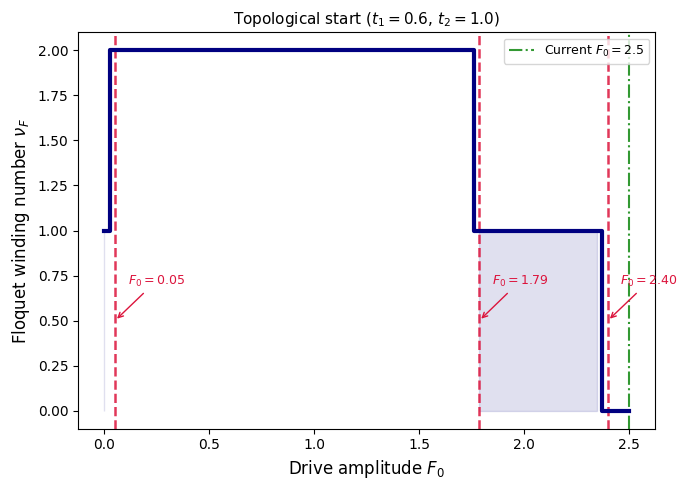

In [19]:
# ── Plot νF vs F0 (with gap shading) ──────────────────────────────────────
fig_nu_t, ax_nu_t = plt.subplots(figsize=(7, 5))
ax_nu_t.step(F0_fl_scan, nuF_topo_scan, where='mid', color='navy', lw=3.0, zorder=3)
ax_nu_t.fill_between(F0_fl_scan, nuF_topo_scan, step='mid',
                     where=(nuF_topo_scan == 1), alpha=0.12, color='navy')
# Mark gapless regions (NaNs) with a hatched area
for i in range(len(F0_fl_scan)-1):
    if np.isnan(nuF_topo_scan[i]) or np.isnan(nuF_topo_scan[i+1]):
        ax_nu_t.axvspan(F0_fl_scan[i], F0_fl_scan[i+1], alpha=0.2, color='gray', hatch='/')
for F0_tr in trans_topo:
    ax_nu_t.axvline(F0_tr, color='crimson', lw=1.8, ls='--', alpha=0.85)
    ax_nu_t.annotate(fr'$F_0={F0_tr:.2f}$',
                     xy=(F0_tr, 0.5), xytext=(F0_tr + 0.06, 0.70),
                     arrowprops=dict(arrowstyle='->', color='crimson'),
                     color='crimson', fontsize=9)
ax_nu_t.axvline(F0, color='green', lw=1.5, ls='-.', alpha=0.8,
               label=fr'Current $F_0={F0}$')
ax_nu_t.set_xlabel(r'Drive amplitude $F_0$', fontsize=12)
ax_nu_t.set_ylabel(r'Floquet winding number $\nu_F$', fontsize=12)
ax_nu_t.set_title(fr'Topological start ($t_1={t1_topo}$, $t_2={t2_topo}$)', fontsize=11)
ax_nu_t.legend(fontsize=9, loc='upper right')
plt.tight_layout()
plt.savefig('nuF_topo_vs_F0.png', dpi=150, bbox_inches='tight')
plt.show()

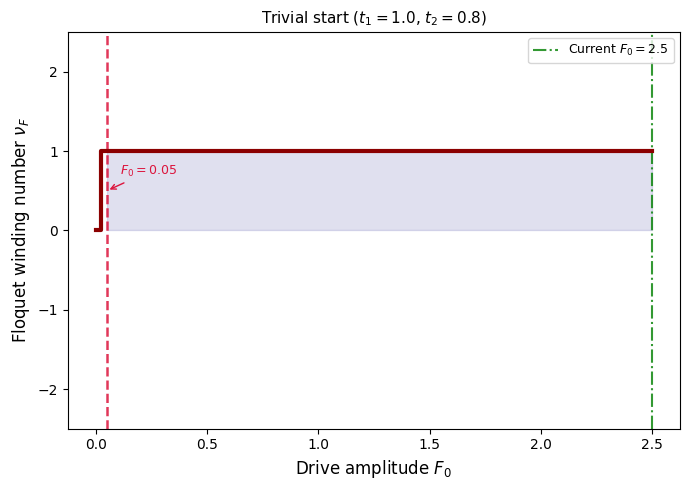

In [20]:
# ── Same for trivial ──────────────────────────────────────────────────────
fig_nu_v, ax_nu_v = plt.subplots(figsize=(7, 5))
ax_nu_v.step(F0_fl_scan, nuF_triv_scan, where='mid', color='darkred', lw=3.0, zorder=3)
ax_nu_v.fill_between(F0_fl_scan, nuF_triv_scan, step='mid',
                     where=(nuF_triv_scan == 1), alpha=0.12, color='navy')
for i in range(len(F0_fl_scan)-1):
    if np.isnan(nuF_triv_scan[i]) or np.isnan(nuF_triv_scan[i+1]):
        ax_nu_v.axvspan(F0_fl_scan[i], F0_fl_scan[i+1], alpha=0.2, color='gray', hatch='/')
for F0_tr in trans_triv:
    ax_nu_v.axvline(F0_tr, color='crimson', lw=1.8, ls='--', alpha=0.85)
    ax_nu_v.annotate(fr'$F_0={F0_tr:.2f}$',
                     xy=(F0_tr, 0.5), xytext=(F0_tr + 0.06, 0.70),
                     arrowprops=dict(arrowstyle='->', color='crimson'),
                     color='crimson', fontsize=9)
ax_nu_v.axvline(F0, color='green', lw=1.5, ls='-.', alpha=0.8,
               label=fr'Current $F_0={F0}$')
ax_nu_v.set_xlabel(r'Drive amplitude $F_0$', fontsize=12)
ax_nu_v.set_ylabel(r'Floquet winding number $\nu_F$', fontsize=12)
ax_nu_v.set_yticks([-2, -1, 0, 1, 2])
ax_nu_v.set_ylim(-2.5, 2.5)
ax_nu_v.set_title(fr'Trivial start ($t_1={t1_triv}$, $t_2={t2_triv}$)', fontsize=11)
ax_nu_v.legend(fontsize=9, loc='upper right')
plt.tight_layout()
plt.savefig('nuF_triv_vs_F0.png', dpi=150, bbox_inches='tight')
plt.show()

## 11. Phase Diagram

We scan the 2D parameter space $(F_0,\; t_2/t_1)$ at fixed $\omega$ and compute $\nu_F$ for each point, revealing the full **laser-induced topological phase diagram**.

Computing phase diagram (35 × 40 = 1400 pts) ...
  t2/t1 = 0.30
  t2/t1 = 0.62
  t2/t1 = 0.95
  t2/t1 = 1.27
  t2/t1 = 1.59
  t2/t1 = 1.92
  t2/t1 = 2.24
Done.


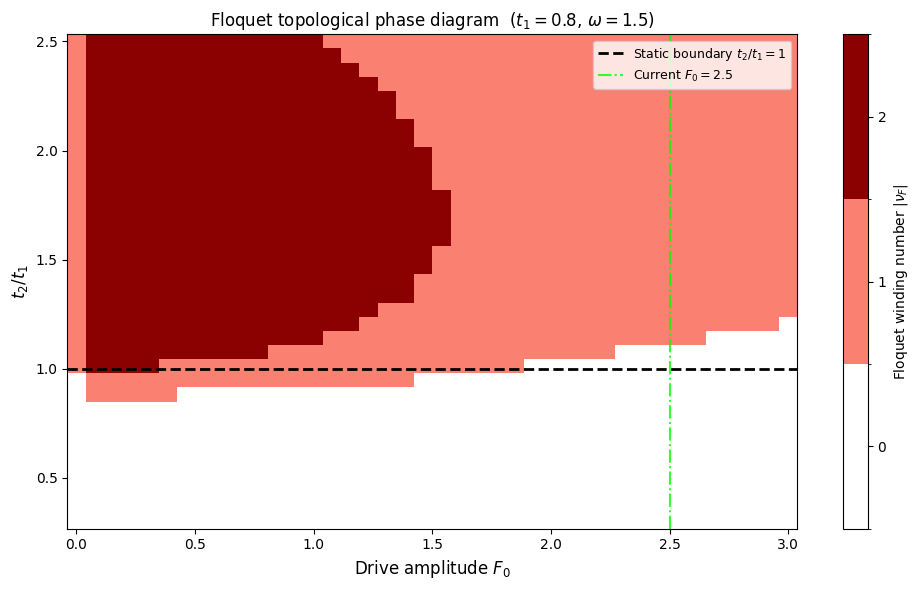

In [21]:
# ── Phase diagram: F0 vs t2/t1 ─────────────────────────────────────────────
n_F0_pd   = 40
n_rat_pd  = 35
F0_pd     = np.linspace(0.0, 3.0, n_F0_pd)
ratio_pd  = np.linspace(0.3, 2.5, n_rat_pd)
t1_fixed  = 0.8

nuF_map = np.full((n_rat_pd, n_F0_pd), np.nan)

print(f"Computing phase diagram ({n_rat_pd} × {n_F0_pd} = {n_rat_pd*n_F0_pd} pts) ...")
for ir, rat in enumerate(ratio_pd):
    t2_pd = t1_fixed * rat
    for jF, F0_val in enumerate(F0_pd):
        winding, gap = floquet_winding_number(t1_fixed, t2_pd, F0_val, n_steps=150)
        nuF_map[ir, jF] = abs(winding) if not np.isnan(winding) else np.nan
    if ir % 5 == 0:
        print(f"  t2/t1 = {rat:.2f}")
print("Done.")

# Mask NaN for plotting
masked_nuF = np.ma.masked_invalid(nuF_map)

# --- Discrete colormap for |νF| = 0,1,2 ---
# Colours: 0 → white, 1 → salmon, 2 → darkred
import matplotlib.colors as mcolors
cmap = mcolors.ListedColormap(['white', 'salmon', 'darkred'])
cmap.set_bad(color='lightgray')   # gapless regions in light gray (or keep white)
bounds = [-0.5, 0.5, 1.5, 2.5]
norm = mcolors.BoundaryNorm(bounds, cmap.N, extend='neither')

fig, ax = plt.subplots(figsize=(10, 6))
im = ax.pcolormesh(F0_pd, ratio_pd, masked_nuF,
                   cmap=cmap, norm=norm, shading='auto')
cbar = plt.colorbar(im, ax=ax, label=r'Floquet winding number $|\nu_F|$',
                    ticks=[0, 1, 2])

# Static boundary (t2/t1 = 1)
ax.axhline(1.0, color='black', lw=2.0, ls='--',
           label=r'Static boundary $t_2/t_1=1$')
# Current drive amplitude
ax.axvline(F0, color='lime', lw=1.5, ls='-.', alpha=0.8,
           label=fr'Current $F_0={F0}$')

# Remove all extra horizontal ratio lines

ax.set_xlabel(r'Drive amplitude $F_0$', fontsize=12)
ax.set_ylabel(r'$t_2 / t_1$', fontsize=12)
ax.set_title(fr'Floquet topological phase diagram  ($t_1={t1_fixed}$, $\omega={omega}$)',
             fontsize=12)
ax.legend(fontsize=9, loc='upper right')
plt.tight_layout()
plt.savefig('phase_diagram.png', dpi=150, bbox_inches='tight')
plt.show()

Computing phase diagram (40 × 40 pts) ...
  F0 = 0.00
  F0 = 0.38
  F0 = 0.77
  F0 = 1.15
  F0 = 1.54
  F0 = 1.92
  F0 = 2.31
  F0 = 2.69
Done.


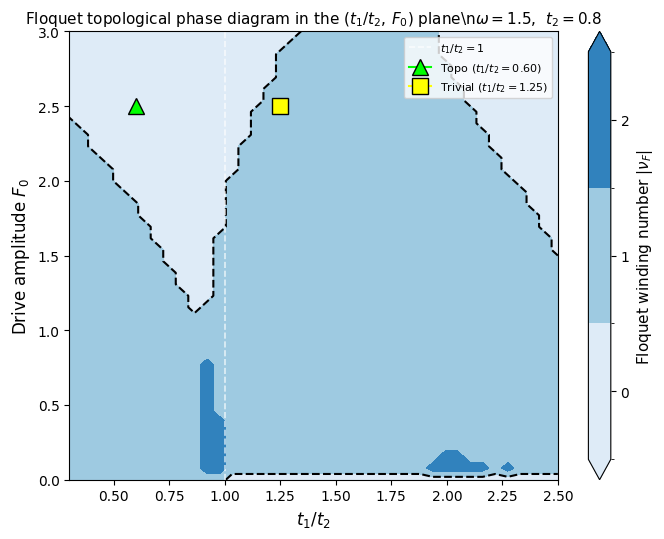

In [34]:
# ── Phase diagram: F0 vs t1/t2 (three shades of blue) ────────────
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm

# ------------------------------------------------------------------
# 1. Compute νF on a grid of (t1/t2, F0), fixing t2 = 0.8.
# ------------------------------------------------------------------
t2_fixed   = 0.8
t1t2_scan  = np.linspace(0.3, 2.5, 40)          # t1/t2
F0_scan_pd = np.linspace(0.0, 3.0, 40)

nuF_map_pd = np.full((len(F0_scan_pd), len(t1t2_scan)), np.nan)

print(f"Computing phase diagram ({len(F0_scan_pd)} × {len(t1t2_scan)} pts) ...")
for iF, F0_val in enumerate(F0_scan_pd):
    for ir, ratio in enumerate(t1t2_scan):
        t1_val = t2_fixed * ratio
        # Make sure floquet_winding_number() is defined elsewhere in your script
        w, _ = floquet_winding_number(t1_val, t2_fixed, F0_val, n_steps=150)
        nuF_map_pd[iF, ir] = abs(w) if not np.isnan(w) else np.nan
    if iF % 5 == 0:
        print(f"  F0 = {F0_val:.2f}")
print("Done.")

# Mask NaNs for plotting
masked_nuF_pd = np.ma.masked_invalid(nuF_map_pd)

# ------------------------------------------------------------------
# 2. Discrete colormap: three shades of blue for νF = 0, 1, 2
# ------------------------------------------------------------------
colors = ['#deebf7', '#9ecae1', '#3182bd']   # light, medium, dark blue
cmap = ListedColormap(colors)
bounds = [-0.5, 0.5, 1.5, 2.5]              # edges of the intervals
norm = BoundaryNorm(bounds, cmap.N, extend='neither')

# ------------------------------------------------------------------
# 3. Create the figure
# ------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(7, 5.5))

# Filled contour with the discrete blue colormap
im = ax.contourf(
    t1t2_scan, F0_scan_pd, masked_nuF_pd,
    levels=bounds,
    cmap=cmap,
    norm=norm,
    extend='both'
)

# Boundary between trivial (νF=0) and non‑trivial (νF≥1)
ax.contour(
    t1t2_scan, F0_scan_pd, masked_nuF_pd,
    levels=[0.5],
    colors='black',
    linewidths=1.5,
    linestyles='--'
)

# Static SSH boundary: t1 = t2
ax.axvline(1.0, color='white', lw=1.2, ls='--', alpha=0.7, label=r'$t_1/t_2=1$')

# Mark the parameters used in the HHG calculation
# (Make sure these variables are defined: t1_topo, t2_topo, t1_triv, t2_triv, F0)
ax.plot(
    t1_topo / t2_topo, F0,
    marker='^', color='lime', markeredgecolor='black',
    ms=11, zorder=5,
    label=fr'Topo ($t_1/t_2={t1_topo/t2_topo:.2f}$)'
)
ax.plot(
    t1_triv / t2_triv, F0,
    marker='s', color='yellow', markeredgecolor='black',
    ms=11, zorder=5,
    label=fr'Trivial ($t_1/t_2={t1_triv/t2_triv:.2f}$)'
)

# Colorbar – styled like the reference
cbar = plt.colorbar(im, ax=ax, ticks=[0, 1, 2])
cbar.set_label(r'Floquet winding number $|\nu_F|$', fontsize=11)

# Axis labels and limits
ax.set_xlabel(r'$t_1 / t_2$', fontsize=12)
ax.set_ylabel(r'Drive amplitude $F_0$', fontsize=12)
ax.set_xlim(t1t2_scan[0], t1t2_scan[-1])
ax.set_ylim(F0_scan_pd[0], F0_scan_pd[-1])

# Title – include omega and t2 (and other parameters if you have them)
ax.set_title(
    fr'Floquet topological phase diagram in the $(t_1/t_2,\,F_0)$ plane'
    fr'\n$\omega={omega}$,  $t_2={t2_fixed}$',
    fontsize=11
)
ax.legend(fontsize=8, loc='upper right')

plt.tight_layout()
plt.savefig('floquet_phasediagram_blue.png', dpi=150, bbox_inches='tight')
plt.show()

Pre-computing 60 Floquet band snapshots ...
Done.
Saved → floquet_gap_tracking.gif


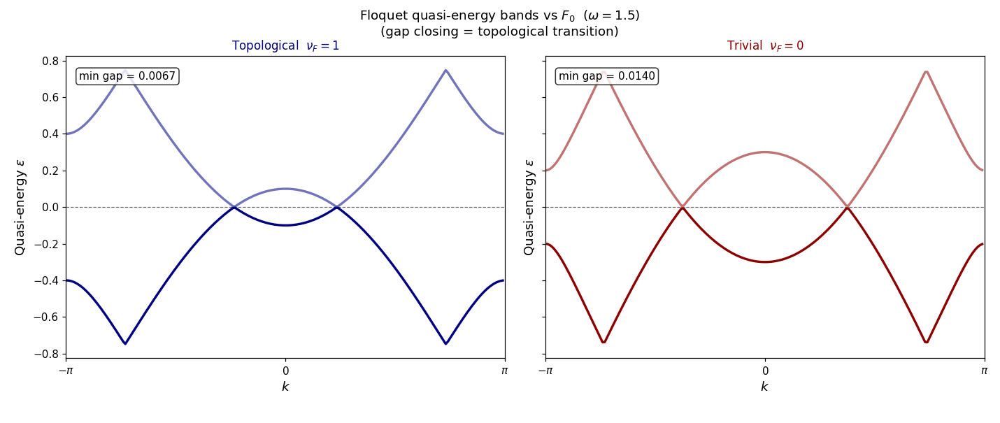

In [23]:
# ── GIF: quasi-energy spectrum as F0 ramps — tracks gap opening/closing ────
n_frames_gif = 60
F0_gif       = np.linspace(0.0, 2.5, n_frames_gif)
k_gif        = np.linspace(-np.pi, np.pi, 200, endpoint=False)
T_laser      = 2*np.pi / omega
qe_lim_gif   = np.pi / T_laser * 1.1

def floquet_bands_2x2(t1, t2, F0_val, k_arr=k_gif, n_steps=120):
    """Quasi-energy bands (Nk,2) from 2x2 Floquet propagator."""
    U   = floquet_propagator_batch(t1, t2, F0_val, k_arr, n_steps)
    eig = np.linalg.eigvals(U)
    qe  = -np.angle(eig) / T_laser
    return np.sort(qe.real, axis=1)

print(f"Pre-computing {n_frames_gif} Floquet band snapshots ...")
bands_topo_gif = [floquet_bands_2x2(t1_topo, t2_topo, Fv) for Fv in F0_gif]
bands_triv_gif = [floquet_bands_2x2(t1_triv, t2_triv, Fv) for Fv in F0_gif]

def abs_winding(t1, t2, F0):
    w, _ = floquet_winding_number(t1, t2, F0)
    return abs(w) if not np.isnan(w) else np.nan

nuF_gif_topo = [abs_winding(t1_topo, t2_topo, Fv) for Fv in F0_gif]
nuF_gif_triv = [abs_winding(t1_triv, t2_triv, Fv) for Fv in F0_gif]
print("Done.")

fig_gif, axes_gif = plt.subplots(1, 2, figsize=(13, 5.5), sharey=True)
ax_t_gif, ax_v_gif = axes_gif

for ax in axes_gif:
    ax.axhline( 0,      color='black', lw=0.8, ls='--', alpha=0.6, zorder=1)
    ax.axhline( qe_lim_gif, color='gray', lw=0.5, ls=':', alpha=0.5)
    ax.axhline(-qe_lim_gif, color='gray', lw=0.5, ls=':', alpha=0.5)
    ax.set_xlim(-np.pi, np.pi)
    ax.set_ylim(-qe_lim_gif, qe_lim_gif)
    ax.set_xticks([-np.pi, 0, np.pi])
    ax.set_xticklabels([r'$-\pi$', '$0$', r'$\pi$'])
    ax.set_xlabel(r'$k$', fontsize=12)
    ax.set_ylabel(r'Quasi-energy $\varepsilon$', fontsize=12)

line_gt0, = ax_t_gif.plot([], [], color='navy',    lw=2.2)
line_gt1, = ax_t_gif.plot([], [], color='navy',    lw=2.2, alpha=0.55)
line_gv0, = ax_v_gif.plot([], [], color='darkred', lw=2.2)
line_gv1, = ax_v_gif.plot([], [], color='darkred', lw=2.2, alpha=0.55)

ttl_t = ax_t_gif.text(0.03, 0.95, '', transform=ax_t_gif.transAxes, fontsize=10,
                        va='top', bbox=dict(boxstyle='round', fc='white', alpha=0.8))
ttl_v = ax_v_gif.text(0.03, 0.95, '', transform=ax_v_gif.transAxes, fontsize=10,
                        va='top', bbox=dict(boxstyle='round', fc='white', alpha=0.8))
ttl_F = fig_gif.text(0.5, 0.01, '', ha='center', fontsize=12, color='black')

fig_gif.suptitle(fr'Floquet quasi-energy bands vs $F_0$  ($\omega={omega}$)'
                 '\n(gap closing = topological transition)',
                 fontsize=12)
plt.tight_layout(rect=[0, 0.04, 1, 1])

def update_gif(frame):
    bt = bands_topo_gif[frame]
    bv = bands_triv_gif[frame]
    nF_t = nuF_gif_topo[frame]
    nF_v = nuF_gif_triv[frame]
    F0_v = F0_gif[frame]

    line_gt0.set_data(k_gif, bt[:, 0])
    line_gt1.set_data(k_gif, bt[:, 1])
    line_gv0.set_data(k_gif, bv[:, 0])
    line_gv1.set_data(k_gif, bv[:, 1])

    col_t = 'navy'    if nF_t == 1 else 'steelblue'
    col_v = 'darkred' if nF_v == 0 else 'coral'
    line_gt0.set_color(col_t); line_gt1.set_color(col_t)
    line_gv0.set_color(col_v); line_gv1.set_color(col_v)

    ax_t_gif.set_title(fr'Topological  $\nu_F={nF_t}$', fontsize=11,
                        color='navy' if nF_t==1 else 'steelblue')
    ax_v_gif.set_title(fr'Trivial  $\nu_F={nF_v}$', fontsize=11,
                        color='darkred' if nF_v==0 else 'coral')

    gap_t = np.min(np.abs(bt[:, 1] - bt[:, 0]))
    gap_v = np.min(np.abs(bv[:, 1] - bv[:, 0]))
    ttl_t.set_text(fr'min gap = {gap_t:.4f}')
    ttl_v.set_text(fr'min gap = {gap_v:.4f}')
    ttl_F.set_text(fr'$F_0 = {F0_v:.3f}$')

    return (line_gt0, line_gt1, line_gv0, line_gv1, ttl_t, ttl_v, ttl_F)

anim_gif = animation.FuncAnimation(fig_gif, update_gif, frames=n_frames_gif,
                                    interval=80, blit=True)
anim_gif.save('floquet_gap_tracking.gif', writer=PillowWriter(fps=14), dpi=110)
plt.close(fig_gif)
print("Saved → floquet_gap_tracking.gif")
Image('floquet_gap_tracking.gif')

Generating GIF of quasi‑energy spectrum vs index ...
Saved → floquet_spectrum_vs_index.gif


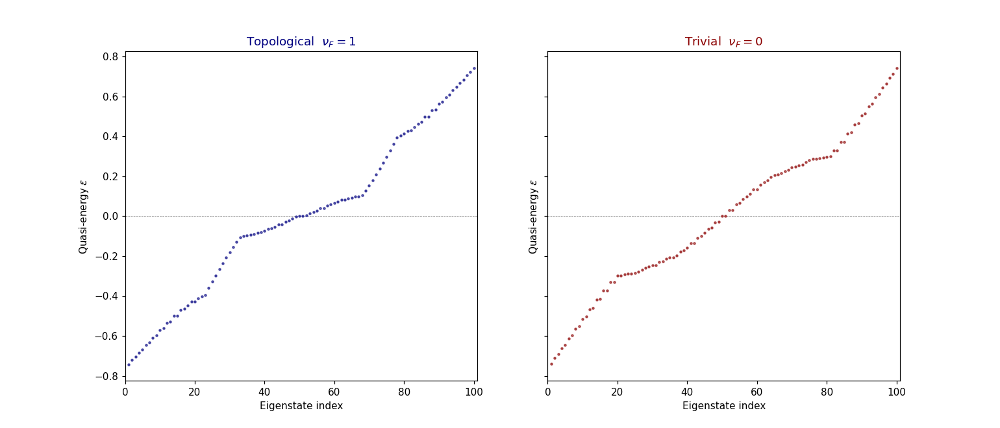

In [24]:
# ── GIF: Real-space Floquet quasi‑energy spectrum vs index for varying F0 ──
# Displays winding number in the title for each frame.
print("Generating GIF of quasi‑energy spectrum vs index ...")

# Pre‑compute |νF| for each F0 in the scan (using the same function)
nuF_topo_gif_idx = [abs_winding(t1_topo, t2_topo, Fv) for Fv in F0_scan]
nuF_triv_gif_idx = [abs_winding(t1_triv, t2_triv, Fv) for Fv in F0_scan]

n_frames_es = len(F0_scan)
fig_es, axes_es = plt.subplots(1, 2, figsize=(14, 6), sharey=True)
ax_t_es, ax_v_es = axes_es

qe_lim_es = np.pi / T_laser * 1.1
for ax, col, lbl in zip([ax_t_es, ax_v_es], ['navy', 'darkred'],
                        ['Topological', 'Trivial']):
    ax.set_xlim(0, M+1)
    ax.set_ylim(-qe_lim_es, qe_lim_es)
    ax.axhline(0, color='gray', lw=0.5, ls='--')
    ax.axhline( qe_lim_es, color='gray', lw=0.5, ls=':')
    ax.axhline(-qe_lim_es, color='gray', lw=0.5, ls=':')
    ax.set_xlabel('Eigenstate index')
    ax.set_ylabel(r'Quasi‑energy $\varepsilon$')

line_t, = ax_t_es.plot([], [], 'o', color='navy',    ms=2, alpha=0.6)
line_v, = ax_v_es.plot([], [], 'o', color='darkred', ms=2, alpha=0.6)
txt_F_es = fig_es.text(0.5, 0.02, '', ha='center', fontsize=12, color='black')

# Titles will update
def update_es(frame):
    idx = frame % n_frames_es
    F0_val = F0_scan[idx]
    spec_t = QE_topo[idx]
    spec_v = QE_triv[idx]
    nF_t = nuF_topo_gif_idx[idx]
    nF_v = nuF_triv_gif_idx[idx]
    x_axis = np.arange(1, M+1)
    line_t.set_data(x_axis, spec_t)
    line_v.set_data(x_axis, spec_v)
    # Update titles with winding numbers
    ax_t_es.set_title(f'Topological  $\\nu_F = {nF_t}$', color='navy' if nF_t==1 else 'steelblue')
    ax_v_es.set_title(f'Trivial  $\\nu_F = {nF_v}$', color='darkred' if nF_v==0 else 'coral')
    txt_F_es.set_text(fr'$F_0 = {F0_val:.3f}$')
    return line_t, line_v, txt_F_es

anim_es = animation.FuncAnimation(fig_es, update_es, frames=n_frames_es,
                                  interval=100, blit=True)
anim_es.save('floquet_spectrum_vs_index.gif', writer=PillowWriter(fps=8), dpi=110)
plt.close(fig_es)
print("Saved → floquet_spectrum_vs_index.gif")
Image('floquet_spectrum_vs_index.gif')

## 12. HHG Analysis: Time Evolution

We evolve the density matrix $\rho(t)$ under the driven Hamiltonian using 4th-order Runge–Kutta:

$$\dot{\rho}(t) = -i\bigl[H(t),\,\rho(t)\bigr]$$

The macroscopic current and HHG power spectrum are:

$$J(t) = \mathrm{Tr}\!\left[\hat{J}(t)\,\rho(t)\right], \qquad
S(\Omega) = \left|\int_0^{t_\mathrm{max}} J(t)\,e^{i\Omega t}\,dt\right|^2$$

With equal bond lengths and inversion symmetry in the **bulk**, only **odd harmonics** are present. Edge-state contributions (topological phase) can modify the even-harmonic content.

In [25]:
def build_rho0(t1, t2):
    """Ground-state density matrix at half filling."""
    _, evecs = np.linalg.eigh(build_H(t1, t2, 0.0))
    psi0 = evecs[:, :M//2]
    return psi0 @ psi0.conj().T


def rhs_coherent(rho, A_val, t1, t2):
    H_t = build_H(t1, t2, A_val)
    return -1j * (H_t @ rho - rho @ H_t)


def time_evolve(t1, t2, A_drive=None, verbose=True):
    """RK4 coherent density-matrix propagation; returns J(t)."""
    if A_drive is None:
        A_drive = A_arr
    rho     = build_rho0(t1, t2)
    current = np.zeros(len(A_drive))
    for step in range(len(A_drive)):
        A_val = A_drive[step]
        current[step] = 2.0 * np.real(np.trace(build_J(t1, t2, A_val) @ rho))
        if step < len(A_drive) - 1:
            A_next = A_drive[step + 1]
            A_mid  = 0.5*(A_val + A_next)
            k1 = rhs_coherent(rho,             A_val,  t1, t2)
            k2 = rhs_coherent(rho + .5*dt*k1,  A_mid,  t1, t2)
            k3 = rhs_coherent(rho + .5*dt*k2,  A_mid,  t1, t2)
            k4 = rhs_coherent(rho +    dt*k3,  A_next, t1, t2)
            rho = rho + (dt/6.0)*(k1 + 2*k2 + 2*k3 + k4)
        if verbose and step % (Nt//5) == 0:
            print(f"  step {step}/{Nt}  ({100*step/Nt:.0f}%)")
    return current


def compute_hhg(current):
    """Hann-windowed FFT → HHG power spectrum. Returns (harm_order, power)."""
    win   = np.hanning(len(current))
    Nfft  = 4 * len(current)
    J_fft = np.fft.rfft(current * win, n=Nfft)
    freqs = np.fft.rfftfreq(Nfft, d=dt)
    S     = np.abs(J_fft)**2
    harm  = freqs / (omega / (2*np.pi))
    return harm, S

Evolving topological phase ...
  step 0/3200  (0%)
  step 640/3200  (20%)
  step 1280/3200  (40%)
  step 1920/3200  (60%)
  step 2560/3200  (80%)

Evolving trivial phase ...
  step 0/3200  (0%)
  step 640/3200  (20%)
  step 1280/3200  (40%)
  step 1920/3200  (60%)
  step 2560/3200  (80%)

Peak current — topo:  107.1087
Peak current — triv:  115.8715


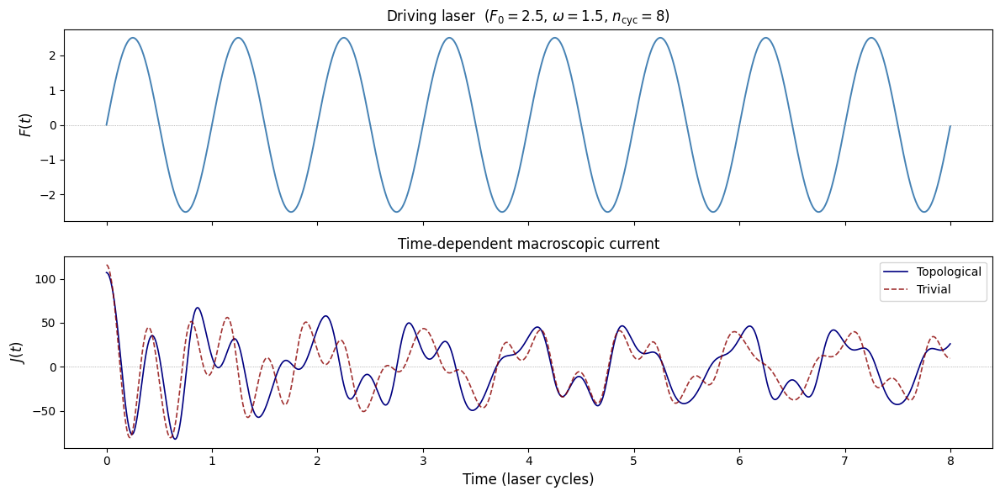

In [26]:
# ── Evolve and compute HHG ─────────────────────────────────────────────────
print("Evolving topological phase ...")
J_topo = time_evolve(t1_topo, t2_topo)

print("\nEvolving trivial phase ...")
J_triv = time_evolve(t1_triv, t2_triv)

harm_topo, S_topo = compute_hhg(J_topo)
harm_triv, S_triv = compute_hhg(J_triv)

print(f"\nPeak current — topo:  {np.max(np.abs(J_topo)):.4f}")
print(f"Peak current — triv:  {np.max(np.abs(J_triv)):.4f}")

# ── Laser field + current time series ─────────────────────────────────────
fig, axes = plt.subplots(2, 1, figsize=(12, 6), sharex=True)
axes[0].plot(t_arr/T_per, F_arr, color='steelblue', lw=1.4)
axes[0].set_ylabel(r'$F(t)$', fontsize=12)
axes[0].set_title(fr'Driving laser  ($F_0={F0}$, $\omega={omega}$, $n_\mathrm{{cyc}}={n_cyc}$)',
                  fontsize=12)
axes[1].plot(t_arr/T_per, J_topo, color='navy',    lw=1.2, label='Topological')
axes[1].plot(t_arr/T_per, J_triv, color='darkred', lw=1.2, ls='--', label='Trivial', alpha=0.8)
axes[1].set_xlabel('Time (laser cycles)', fontsize=12)
axes[1].set_ylabel(r'$J(t)$', fontsize=12)
axes[1].set_title('Time-dependent macroscopic current', fontsize=12)
axes[1].legend(fontsize=10)
for ax in axes: ax.axhline(0, color='gray', lw=0.5, ls=':')
plt.tight_layout()
plt.savefig('HHG_current.png', dpi=150, bbox_inches='tight')
plt.show()

## 13. HHG Power Spectrum with Phase Transition Markers

The HHG spectrum $S(\Omega)$ is shown with vertical markers at the **Floquet winding number transition** amplitudes $F_0^*$ (computed in the Floquet section).

Key features to look for:  
- **Plateau**: broad region of near-constant harmonic intensity above the ionisation threshold  
- **Cutoff**: roll-off around the gap harmonic order $n_\mathrm{gap} = \Delta/\omega = 2|t_1-t_2|/\omega$  
- **Even harmonics**: absent in the bulk-symmetric case; edge-state contribution in the topological phase

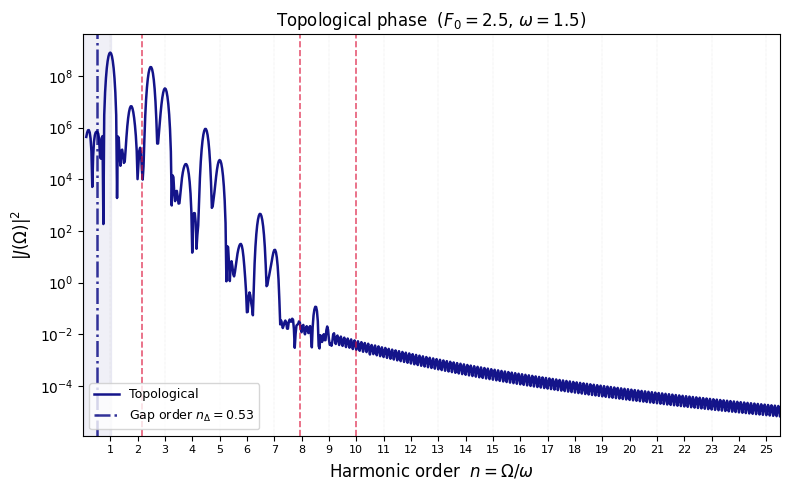

In [27]:
# ── HHG power spectrum + Floquet transition markers (dashes only) ────────
gap_topo   = 2*abs(t1_topo - t2_topo)
gap_triv   = 2*abs(t1_triv - t2_triv)
n_gap_topo = gap_topo / omega
n_gap_triv = gap_triv / omega

# ── Figure: Topological HHG spectrum ──────────────────────────────────────
fig_h_t, ax_h_t = plt.subplots(figsize=(8, 5))
mask = (harm_topo > 0.1) & (harm_topo < 26)
ax_h_t.semilogy(harm_topo[mask], S_topo[mask], color='navy', lw=1.8, label='Topological', alpha=0.92)

# Odd harmonic guides
for n in range(1, 26, 2):
    ax_h_t.axvline(n, color='gray', lw=0.35, alpha=0.35, ls=':')

# Gap order line
ax_h_t.axvline(n_gap_topo, color='navy', lw=1.8, ls='-.', alpha=0.8,
               label=fr'Gap order $n_\Delta = {n_gap_topo:.2f}$')
ax_h_t.axvspan(n_gap_topo - 0.5, n_gap_topo + 0.5, alpha=0.06, color='navy')

# --- Floquet transition markers: only vertical dashed lines (no text) ---
for F0_tr in trans_topo:
    # Convert transition F0 to a harmonic order (heuristic)
    n_mark = min(F0_tr / omega * 5 + 2, 24)
    ax_h_t.axvline(n_mark, color='crimson', linestyle='--', linewidth=1.2, alpha=0.7)

ax_h_t.set_ylabel(r'$|J(\Omega)|^2$', fontsize=12)
ax_h_t.set_title(f'Topological phase  ($F_0={F0}$, $\\omega={omega}$)', fontsize=12)
ax_h_t.legend(fontsize=9, loc='lower left')
ax_h_t.set_xlim(0, 25.5)
ax_h_t.set_xticks(range(1, 26))
ax_h_t.set_xticklabels([str(n) for n in range(1, 26)], fontsize=8)
ax_h_t.set_xlabel(r'Harmonic order  $n = \Omega/\omega$', fontsize=12)
plt.tight_layout()
plt.savefig('HHG_topo.png', dpi=150, bbox_inches='tight')
plt.show()

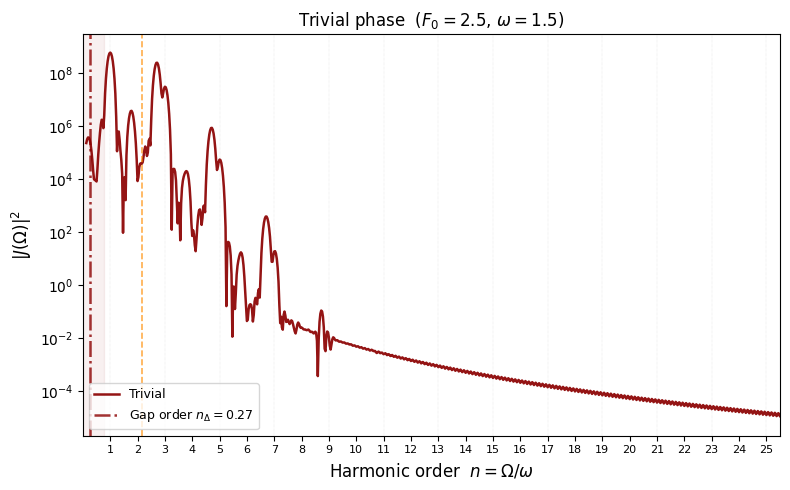

In [28]:
# ── Figure: Trivial HHG spectrum ──────────────────────────────────────────
fig_h_v, ax_h_v = plt.subplots(figsize=(8, 5))
mask_v = (harm_triv > 0.1) & (harm_triv < 26)
ax_h_v.semilogy(harm_triv[mask_v], S_triv[mask_v], color='darkred', lw=1.8, label='Trivial', alpha=0.92)

for n in range(1, 26, 2):
    ax_h_v.axvline(n, color='gray', lw=0.35, alpha=0.35, ls=':')

ax_h_v.axvline(n_gap_triv, color='darkred', lw=1.8, ls='-.', alpha=0.8,
               label=fr'Gap order $n_\Delta = {n_gap_triv:.2f}$')
ax_h_v.axvspan(n_gap_triv - 0.5, n_gap_triv + 0.5, alpha=0.06, color='darkred')

# --- Floquet transition markers: only vertical dashed lines ---
for F0_tr in trans_triv:
    n_mark = min(F0_tr / omega * 5 + 2, 24)
    ax_h_v.axvline(n_mark, color='darkorange', linestyle='--', linewidth=1.2, alpha=0.7)

ax_h_v.set_ylabel(r'$|J(\Omega)|^2$', fontsize=12)
ax_h_v.set_title(f'Trivial phase  ($F_0={F0}$, $\\omega={omega}$)', fontsize=12)
ax_h_v.legend(fontsize=9, loc='lower left')
ax_h_v.set_xlim(0, 25.5)
ax_h_v.set_xticks(range(1, 26))
ax_h_v.set_xticklabels([str(n) for n in range(1, 26)], fontsize=8)
ax_h_v.set_xlabel(r'Harmonic order  $n = \Omega/\omega$', fontsize=12)
plt.tight_layout()
plt.savefig('HHG_triv.png', dpi=150, bbox_inches='tight')
plt.show()

## 14. Odd vs Even Harmonic Decomposition

In a system with bulk **inversion symmetry** (equal bond lengths, $d_1 = d_2$), only **odd harmonics** are allowed by symmetry.

Even harmonics can arise from:
1. **Broken inversion symmetry** at the edges — signature of the **topological phase** (edge states)  
2. Sub-cycle dynamics / transient effects

The **even/odd ratio** $R = \sum_\text{even} S_n / \sum_\text{odd} S_n$ is a spectroscopic observable that distinguishes topological from trivial.

In [29]:
def harmonic_intensities(harm, spectrum, n_max=20):
    """Peak spectral power at each integer harmonic 1…n_max."""
    orders = np.arange(1, n_max + 1)
    intens = np.zeros(n_max)
    for idx, n in enumerate(orders):
        win = (harm >= n - 0.4) & (harm <= n + 0.4)
        intens[idx] = np.max(spectrum[win]) if win.any() else 1e-50
    return orders, intens


ns_t, Is_t = harmonic_intensities(harm_topo, S_topo)
ns_v, Is_v = harmonic_intensities(harm_triv, S_triv)

odd_mask  = (ns_t % 2 == 1)
even_mask = (ns_t % 2 == 0)

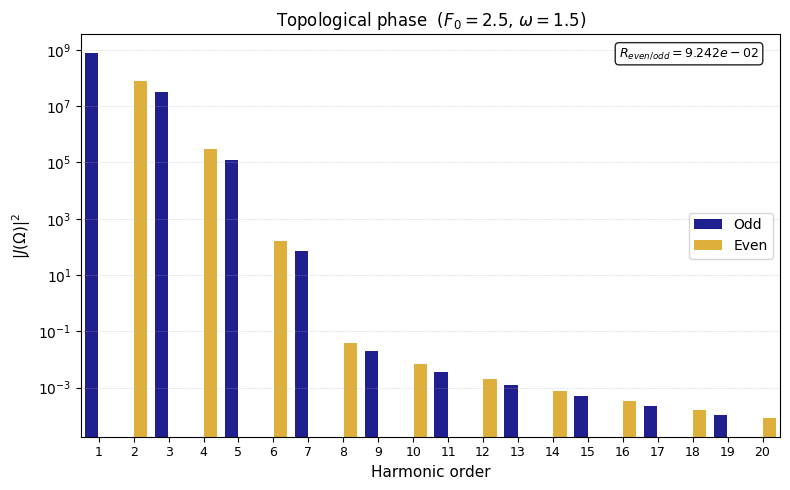

In [30]:
# ── Figure 4a: Odd/Even bars for topological ──────────────────────────────
fig_oe_t, ax_oe_t = plt.subplots(figsize=(8, 5))
odd_mask  = (ns_t % 2 == 1)
even_mask = (ns_t % 2 == 0)
ax_oe_t.bar(ns_t[odd_mask]  - 0.2, Is_t[odd_mask],
            width=0.38, color='navy',        alpha=0.88, label='Odd')
ax_oe_t.bar(ns_t[even_mask] + 0.2, Is_t[even_mask],
            width=0.38, color='goldenrod',   alpha=0.88, label='Even')
ax_oe_t.set_yscale('log')
ax_oe_t.set_xticks(np.arange(1, 21))
ax_oe_t.set_xticklabels([str(n) for n in range(1, 21)], fontsize=9)
ax_oe_t.set_xlim(0.5, 20.5)
ax_oe_t.set_xlabel('Harmonic order', fontsize=11)
ax_oe_t.set_ylabel(r'$|J(\Omega)|^2$', fontsize=11)
ax_oe_t.set_title(f'Topological phase  ($F_0={F0}$, $\\omega={omega}$)', fontsize=12)
ax_oe_t.legend(fontsize=10)
ax_oe_t.grid(True, ls=':', lw=0.4, axis='y')
ratio_t = np.sum(Is_t[even_mask]) / np.sum(Is_t[odd_mask])
ax_oe_t.text(0.97, 0.97, fr'$R_{{even/odd}} = {ratio_t:.3e}$',
             transform=ax_oe_t.transAxes, fontsize=9, ha='right', va='top',
             bbox=dict(boxstyle='round', fc='white', alpha=0.85))
plt.tight_layout()
plt.savefig('odd_even_topo.png', dpi=150, bbox_inches='tight')
plt.show()

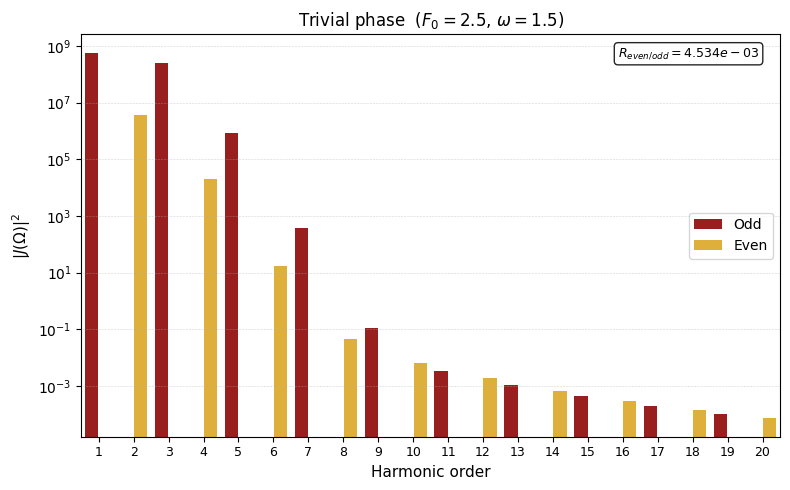

In [31]:
# ── Figure 4b: Odd/Even bars for trivial ──────────────────────────────────
fig_oe_v, ax_oe_v = plt.subplots(figsize=(8, 5))
odd_mask_v  = (ns_v % 2 == 1)
even_mask_v = (ns_v % 2 == 0)
ax_oe_v.bar(ns_v[odd_mask_v]  - 0.2, Is_v[odd_mask_v],
            width=0.38, color='darkred',     alpha=0.88, label='Odd')
ax_oe_v.bar(ns_v[even_mask_v] + 0.2, Is_v[even_mask_v],
            width=0.38, color='goldenrod',   alpha=0.88, label='Even')
ax_oe_v.set_yscale('log')
ax_oe_v.set_xticks(np.arange(1, 21))
ax_oe_v.set_xticklabels([str(n) for n in range(1, 21)], fontsize=9)
ax_oe_v.set_xlim(0.5, 20.5)
ax_oe_v.set_xlabel('Harmonic order', fontsize=11)
ax_oe_v.set_ylabel(r'$|J(\Omega)|^2$', fontsize=11)
ax_oe_v.set_title(f'Trivial phase  ($F_0={F0}$, $\\omega={omega}$)', fontsize=12)
ax_oe_v.legend(fontsize=10)
ax_oe_v.grid(True, ls=':', lw=0.4, axis='y')
ratio_v = np.sum(Is_v[even_mask_v]) / np.sum(Is_v[odd_mask_v])
ax_oe_v.text(0.97, 0.97, fr'$R_{{even/odd}} = {ratio_v:.3e}$',
             transform=ax_oe_v.transAxes, fontsize=9, ha='right', va='top',
             bbox=dict(boxstyle='round', fc='white', alpha=0.85))
plt.tight_layout()
plt.savefig('odd_even_triv.png', dpi=150, bbox_inches='tight')
plt.show()

Scanning 16 F0 values for HHG maps ...
  F0 = 0.20  done
  F0 = 0.35  done
  F0 = 0.51  done
  F0 = 0.66  done
  F0 = 0.81  done
  F0 = 0.97  done
  F0 = 1.12  done
  F0 = 1.27  done
  F0 = 1.43  done
  F0 = 1.58  done
  F0 = 1.73  done
  F0 = 1.89  done
  F0 = 2.04  done
  F0 = 2.19  done
  F0 = 2.35  done
  F0 = 2.50  done


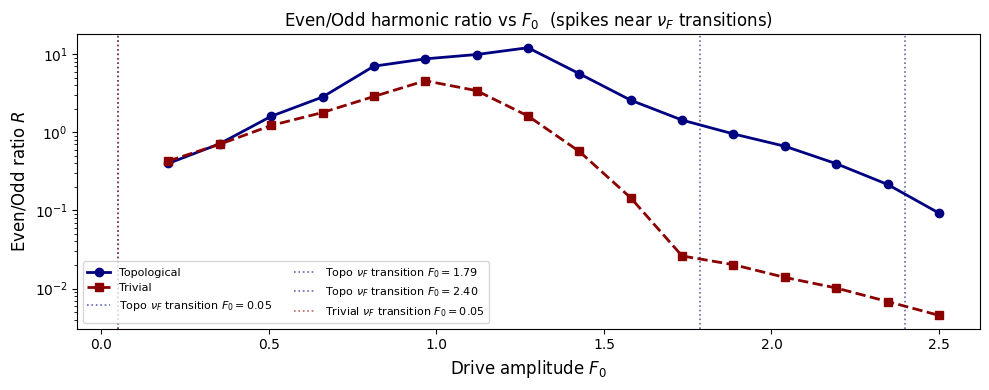

In [32]:
# ── Even/odd ratio vs F0 ───────────────────────────────────────────────────
F0_hhg_scan = np.linspace(0.2, 2.5, 16)
S_topo_list = []
S_triv_list = []
A_arr_bak   = A_arr.copy()

print(f"Scanning {len(F0_hhg_scan)} F0 values for HHG maps ...")
for F0_val in F0_hhg_scan:
    A_temp = -(F0_val/omega)*np.cos(omega*t_arr)
    Jt = time_evolve(t1_topo, t2_topo, A_drive=A_temp, verbose=False)
    Jv = time_evolve(t1_triv, t2_triv, A_drive=A_temp, verbose=False)
    S_topo_list.append(compute_hhg(Jt))
    S_triv_list.append(compute_hhg(Jv))
    print(f"  F0 = {F0_val:.2f}  done")

h_ref = S_topo_list[0][0]
hmask = (h_ref > 0) & (h_ref < 22)
h_ax  = h_ref[hmask]
map_t = np.array([St[hmask] for _,St in S_topo_list])
map_v = np.array([Sv[hmask] for _,Sv in S_triv_list])
ratio_topo = []
ratio_triv = []
for (ht, St), (hv, Sv) in zip(S_topo_list, S_triv_list):
    nst, It = harmonic_intensities(ht, St)
    nsv, Iv = harmonic_intensities(hv, Sv)
    ratio_topo.append(np.sum(It[even_mask]) / (np.sum(It[odd_mask]) + 1e-60))
    ratio_triv.append(np.sum(Iv[even_mask]) / (np.sum(Iv[odd_mask]) + 1e-60))

fig, ax = plt.subplots(figsize=(10, 4))
ax.semilogy(F0_hhg_scan, ratio_topo, 'o-', color='navy',    lw=2, ms=6,
            label='Topological')
ax.semilogy(F0_hhg_scan, ratio_triv, 's--', color='darkred', lw=2, ms=6,
            label='Trivial')
for F0_tr in trans_topo:
    ax.axvline(F0_tr, color='navy',    lw=1.2, ls=':', alpha=0.6,
               label=fr'Topo $\nu_F$ transition $F_0={F0_tr:.2f}$')
for F0_tr in trans_triv:
    ax.axvline(F0_tr, color='darkred', lw=1.2, ls=':', alpha=0.6,
               label=fr'Trivial $\nu_F$ transition $F_0={F0_tr:.2f}$')
ax.set_xlabel(r'Drive amplitude $F_0$', fontsize=12)
ax.set_ylabel(r'Even/Odd ratio $R$', fontsize=12)
ax.set_title(r'Even/Odd harmonic ratio vs $F_0$  '
             r'(spikes near $\nu_F$ transitions)', fontsize=12)
ax.legend(fontsize=8, ncol=2)
plt.tight_layout()
plt.savefig('even_odd_ratio.png', dpi=150, bbox_inches='tight')
plt.show()